##       -----------------------------             **SUPPLY CHAIN ANALYSIS PROJECT**        ---------------------------------
#### Author: Turgud Valiyev
#### Date : 21/05/2024
#### Objective: To Prepare ML and Neural Network Models to predict "LATE DELIVERY RISK" via considering Automation
#### DATASET LINK: https://www.kaggle.com/datasets/dhanushkatharanga/supply-chain-dataset
#### DATASET SHAPE: 180519 Observations, 53 Features
#### KEYWORDS: Machine Learning, Supply Chain Management, Late Delivery Risk, Automation


##### Supply Chain Management is one of the crucial factors of the businesses and Late Delivery is directly influence profit of the organizations which makes this study important. Via Finding the factors which affecting the LATE DELIVERY RISK and Forecasting the potential risks may contibute Supply Chain Management positively.

##### Applying EDGE COMPUTING in this problem is indeed needed because the companies doing this process continuously and frequently. Providing the model available offline will increase the efficiency and productivity which is perfectly fine for the continuous Supply Chain Data.

## ----------------------------------------------------------------------------------

### 1. Package Installation and Dataset Import

In [2]:
!pip install kagglehub --upgrade
import kagglehub
# Data Manipulation and Analysis
import numpy as np
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import express as px
import matplotlib as mpl
from bokeh.plotting import figure, show

In [3]:
!pip install scikit-learn
!pip install xgboost
!pip install lightgbm
!pip install catboost
!pip install statsmodels
!pip install scipy
!pip install optuna

# Machine Learning
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import xgboost as xgb
import lightgbm as lgb

In [4]:



!pip install tensorflow
!pip install torch torchvision torchaudio
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
from tensorflow import keras
!pip install tflite-runtime

# Deep Learning
import tensorflow as tf
from tensorflow import keras
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from tensorflow.lite.python.interpreter import Interpreter

   ---------------------------------------- 0.0/434.5 kB ? eta -:--:--
    --------------------------------------- 10.2/434.5 kB ? eta -:--:--
   ----- --------------------------------- 61.4/434.5 kB 812.7 kB/s eta 0:00:01
   ----------- ---------------------------- 122.9/434.5 kB 1.0 MB/s eta 0:00:01
   ------------------ --------------------- 204.8/434.5 kB 1.1 MB/s eta 0:00:01
   -------------------------- ------------- 286.7/434.5 kB 1.3 MB/s eta 0:00:01
   -------------------------------- ------- 358.4/434.5 kB 1.4 MB/s eta 0:00:01
   ---------------------------------------  430.1/434.5 kB 1.4 MB/s eta 0:00:01
   ---------------------------------------- 434.5/434.5 kB 1.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.2
    Uninstalling protobuf-3.20.2:
      Successfully uninstalled protobuf-3.20.2


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
onnxconverter-common 1.14.0 requires protobuf==3.20.2, but you have protobuf 5.29.2 which is incompatible.
streamlit 1.30.0 requires protobuf<5,>=3.20, but you have protobuf 5.29.2 which is incompatible.


Looking in indexes: https://download.pytorch.org/whl/cu118


ERROR: Could not find a version that satisfies the requirement tflite-runtime (from versions: none)
ERROR: No matching distribution found for tflite-runtime


In [5]:

# Download latest version
path = kagglehub.dataset_download("dhanushkatharanga/supply-chain-dataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\User\.cache\kagglehub\datasets\dhanushkatharanga\supply-chain-dataset\versions\1


In [6]:
import pandas as pd
import os

# Get the first file in the dataset folder (assuming it's a CSV file)
dataset_files = os.listdir(path)
csv_files = [file for file in dataset_files if file.endswith('.csv')]

if csv_files:
    # Load the first CSV file
    dataset_path = os.path.join(path, csv_files[0])
    data = pd.read_csv(dataset_path)

    # Display the first few rows of the dataset
    print("First few rows of the dataset:")
    print(data.head())

    # Display basic information about the dataset
    print("\nDataset Info:")
    print(data.info())
else:
    print("No CSV files found in the downloaded dataset.")


First few rows of the dataset:
       Type  Days_for_shipping_real  Days_for _shipment_scheduled  \
0     DEBIT                       3                             4   
1  TRANSFER                       5                             4   
2      CASH                       4                             4   
3     DEBIT                       3                             4   
4   PAYMENT                       2                             4   

   Benefit_per_order  Sales_per_customer   Delivery_Status  \
0          91.250000          314.640015  Advance shipping   
1        -249.089996          311.359985     Late delivery   
2        -247.779999          309.720001  Shipping on time   
3          22.860001          304.809998  Advance shipping   
4         134.210007          298.250000  Advance shipping   

   Late_delivery_risk  Category_Id   Category_Name Customer_City  ...  \
0                   0           73  Sporting Goods        Caguas  ...   
1                   1           73 

In [7]:
print(data.columns.tolist())

['Type', 'Days_for_shipping_real', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Sales_per_customer', 'Delivery_Status', 'Late_delivery_risk', 'Category_Id', 'Category_Name', 'Customer_City', 'Customer_Country', 'Customer_Email', 'Customer_Fname', 'Customer_Id', 'Customer_Lname', 'Customer_Password', 'Customer_Segment', 'Customer_State', 'Customer_Street', 'Customer_Zipcode', 'Department_Id', 'Department_Name', 'Latitude', 'Longitude', 'Market', 'Order_City', 'Order_Country', 'Order_Customer_Id', 'order_date_DateOrders', 'Order_Id', 'Order_Item_Cardprod Id', 'Order_Item_Discount', 'Order_item_Discount_Rate', 'Order_Item_Id', 'Order_Item_Product_Price', 'Order_Item_Profit_Ratio', 'Order_Item _Quantity', 'Sales', 'Order_Item_Total', 'Order_Profit_Per_Order', 'Order_Region', 'Order_State', 'Order_Status', 'Order_Zipcode', 'Product_Card_Id', 'Product_Category_Id', 'Product_Description', 'Product_Image', 'Product_Name', 'Product_Price', 'Product_Status', 'shipping_date_DateOrders', 

In [8]:
data.head().style

,Type,Days_for_shipping_real,Days_for _shipment_scheduled,Benefit_per_order,Sales_per_customer,Delivery_Status,Late_delivery_risk,Category_Id,Category_Name,Customer_City,Customer_Country,Customer_Email,Customer_Fname,Customer_Id,Customer_Lname,Customer_Password,Customer_Segment,Customer_State,Customer_Street,Customer_Zipcode,Department_Id,Department_Name,Latitude,Longitude,Market,Order_City,Order_Country,Order_Customer_Id,order_date_DateOrders,Order_Id,Order_Item_Cardprod Id,Order_Item_Discount,Order_item_Discount_Rate,Order_Item_Id,Order_Item_Product_Price,Order_Item_Profit_Ratio,Order_Item _Quantity,Sales,Order_Item_Total,Order_Profit_Per_Order,Order_Region,Order_State,Order_Status,Order_Zipcode,Product_Card_Id,Product_Category_Id,Product_Description,Product_Image,Product_Name,Product_Price,Product_Status,shipping_date_DateOrders,Shipping_Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.000000,2,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,20755,1/31/2018 22:56,77202,1360,13.110000,0.040000,180517,327.750000,0.290000,1,327.750000,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,nan,1360,73,nan,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.000000,2,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,19492,1/13/2018 12:27,75939,1360,16.389999,0.050000,179254,327.750000,-0.800000,1,327.750000,311.359985,-249.089996,South Asia,FALSE,PENDING,nan,1360,73,nan,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.000000,2,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,19491,1/13/2018 12:06,75938,1360,18.030001,0.060000,179253,327.750000,-0.800000,1,327.750000,309.720001,-247.779999,South Asia,FALSE,CLOSED,nan,1360,73,nan,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.000000,2,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,19490,1/13/2018 11:45,75937,1360,22.940001,0.070000,179252,327.750000,0.080000,1,327.750000,304.809998,22.860001,Oceania,Queensland,COMPLETE,nan,1360,73,nan,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,19489,Hendricks,XXXXXXXXX,Corporate,PR,8671 Iron Anchor Corners,725.000000,2,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,19489,1/13/2018 11:24,75936,1360,29.500000,0.090000,179251,327.750000,0.450000,1,327.750000,298.250000,134.210007,Oceania,Queensland,PENDING_PAYMENT,nan,1360,73,nan,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 11:24,Standard Class


#### 2. DATA CLEANING


In [9]:
# Assuming the dataset is loaded into a DataFrame named 'data'
# Display the number of columns and rows
num_rows, num_cols = data.shape
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_cols}")

Number of rows: 180519
Number of columns: 53


In [10]:
# Find total missing values in the dataset
total_missing = data.isnull().sum().sum()
print(f"Total missing values in the dataset: {total_missing}")

Total missing values in the dataset: 336209


In [11]:
# Find the number of missing values by column
missing_by_column = data.isnull().sum()
print("Number of missing values by column:")
print(missing_by_column[missing_by_column > 0])

Number of missing values by column:
Customer_Lname              8
Customer_Zipcode            3
Order_Zipcode          155679
Product_Description    180519
dtype: int64


In [12]:
# Drop unnecessary columns
data = data.drop(columns=['Order_Zipcode', 'Product_Description'])

# Fill missing values in 'Customer_Lname' and 'Customer_Zipcode' with their mode
data['Customer_Lname'].fillna(data['Customer_Lname'].mode()[0], inplace=True)
data['Customer_Zipcode'].fillna(data['Customer_Zipcode'].mode()[0], inplace=True)

In [13]:
# Find total missing values in the dataset
total_missing = data.isnull().sum().sum()
print(f"Total missing values in the dataset: {total_missing}")

# Display the number of columns and rows
num_rows, num_cols = data.shape
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_cols}")

Total missing values in the dataset: 0
Number of rows: 180519
Number of columns: 51


In [14]:
# Convert columns to appropriate data types
categorical_columns = [
    'Type', 'Delivery_Status', 'Late_delivery_risk', 'Category_Id', 'Category_Name',
    'Customer_City', 'Customer_Country', 'Customer_Email', 'Customer_Fname',
    'Customer_Lname', 'Customer_Segment', 'Customer_State', 'Customer_Street',
    'Customer_Zipcode', 'Department_Id', 'Department_Name', 'Market', 'Order_City',
    'Order_Country', 'Order_State', 'Order_Status', 'Product_Card_Id', 'Product_Category_Id',
    'Product_Status', 'Shipping_Mode'
]

numeric_columns = [
    'Days_for_shipping_real', 'Days_for _shipment_scheduled', 'Benefit_per_order',
    'Sales_per_customer', 'Latitude', 'Longitude', 'Order_Item_Cardprod Id',
    'Order_Item_Discount', 'Order_item_Discount_Rate', 'Order_Item_Id',
    'Order_Item_Product_Price', 'Order_Item_Profit_Ratio', 'Order_Item _Quantity',
    'Sales', 'Order_Item_Total', 'Order_Profit_Per_Order', 'Product_Price'
]

date_columns = ['order_date_DateOrders', 'shipping_date_DateOrders']

# Convert categorical columns
for col in categorical_columns:
    data[col] = data[col].astype('category')

# Convert numeric columns
for col in numeric_columns:
    data[col] = pd.to_numeric(data[col], errors='coerce')

# Convert date columns
for col in date_columns:
    data[col] = pd.to_datetime(data[col], errors='coerce')

# Verify data types
print(data.dtypes)

Type                                  category
Days_for_shipping_real                   int64
Days_for _shipment_scheduled             int64
Benefit_per_order                      float64
Sales_per_customer                     float64
Delivery_Status                       category
Late_delivery_risk                    category
Category_Id                           category
Category_Name                         category
Customer_City                         category
Customer_Country                      category
Customer_Email                        category
Customer_Fname                        category
Customer_Id                              int64
Customer_Lname                        category
Customer_Password                       object
Customer_Segment                      category
Customer_State                        category
Customer_Street                       category
Customer_Zipcode                      category
Department_Id                         category
Department_Na

In [15]:
from sklearn.model_selection import train_test_split
# Split the data into training and validation sets (80% train, 20% validation)
train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)
print(f"Training data size: {train_data.shape}")
print(f"Validation data size: {val_data.shape}")

Training data size: (144415, 51)
Validation data size: (36104, 51)


In [16]:
# Identify numeric columns
numeric_columns = train_data.select_dtypes(include=['float64', 'int64']).columns

# Count outliers in numeric columns (using 1.5*IQR rule)
outliers_count = {}
for col in numeric_columns:
    Q1 = train_data[col].quantile(0.25)
    Q3 = train_data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count[col] = ((train_data[col] < lower_bound) | (train_data[col] > upper_bound)).sum()

print("Number of outliers in numeric columns:")
print(outliers_count)


Number of outliers in numeric columns:
{'Days_for_shipping_real': 0, 'Days_for _shipment_scheduled': 0, 'Benefit_per_order': 15128, 'Sales_per_customer': 1559, 'Customer_Id': 951, 'Latitude': 7, 'Longitude': 1157, 'Order_Customer_Id': 951, 'Order_Id': 0, 'Order_Item_Cardprod Id': 0, 'Order_Item_Discount': 6013, 'Order_item_Discount_Rate': 0, 'Order_Item_Id': 0, 'Order_Item_Product_Price': 1646, 'Order_Item_Profit_Ratio': 13836, 'Order_Item _Quantity': 0, 'Sales': 400, 'Order_Item_Total': 1559, 'Order_Profit_Per_Order': 15128, 'Product_Price': 1646}


In [17]:
from scipy.stats.mstats import winsorize
# Winsorize numeric columns in both train and validation data
for col in numeric_columns:
    train_data[col] = winsorize(train_data[col], limits=[0.05, 0.05])
    val_data[col] = winsorize(val_data[col], limits=[0.05, 0.05])

print("Winsorizing completed.")

Winsorizing completed.


In [18]:
from scipy.stats.mstats import winsorize
# Winsorize numeric columns in both train and validation data
for col in numeric_columns:
    train_data[col] = winsorize(train_data[col], limits=[0.10, 0.10])
    val_data[col] = winsorize(val_data[col], limits=[0.05, 0.10])

print("Winsorizing completed.")

Winsorizing completed.


In [19]:
# Count outliers in numeric columns (using 1.5*IQR rule)
outliers_count = {}
for col in numeric_columns:
    Q1 = train_data[col].quantile(0.25)
    Q3 = train_data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count[col] = ((train_data[col] < lower_bound) | (train_data[col] > upper_bound)).sum()

print("Number of outliers in numeric columns:")
print(outliers_count)

Number of outliers in numeric columns:
{'Days_for_shipping_real': 0, 'Days_for _shipment_scheduled': 0, 'Benefit_per_order': 0, 'Sales_per_customer': 0, 'Customer_Id': 0, 'Latitude': 0, 'Longitude': 0, 'Order_Customer_Id': 0, 'Order_Id': 0, 'Order_Item_Cardprod Id': 0, 'Order_Item_Discount': 0, 'Order_item_Discount_Rate': 0, 'Order_Item_Id': 0, 'Order_Item_Product_Price': 0, 'Order_Item_Profit_Ratio': 0, 'Order_Item _Quantity': 0, 'Sales': 0, 'Order_Item_Total': 0, 'Order_Profit_Per_Order': 0, 'Product_Price': 0}


c:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a

In [20]:
np.sum(outliers_count)

{'Days_for_shipping_real': 0,
 'Days_for _shipment_scheduled': 0,
 'Benefit_per_order': 0,
 'Sales_per_customer': 0,
 'Customer_Id': 0,
 'Latitude': 0,
 'Longitude': 0,
 'Order_Customer_Id': 0,
 'Order_Id': 0,
 'Order_Item_Cardprod Id': 0,
 'Order_Item_Discount': 0,
 'Order_item_Discount_Rate': 0,
 'Order_Item_Id': 0,
 'Order_Item_Product_Price': 0,
 'Order_Item_Profit_Ratio': 0,
 'Order_Item _Quantity': 0,
 'Sales': 0,
 'Order_Item_Total': 0,
 'Order_Profit_Per_Order': 0,
 'Product_Price': 0}

##### Data Balance 

In [21]:
# Check data balance for the target variable in training data
train_balance = train_data['Late_delivery_risk'].value_counts(normalize=True) * 100
print("Training Data Balance (percentage):")
print(train_balance)

# Check data balance for the target variable in validation data
val_balance = val_data['Late_delivery_risk'].value_counts(normalize=True) * 100
print("\nValidation Data Balance (percentage):")
print(val_balance)


Training Data Balance (percentage):
Late_delivery_risk
1    54.8281
0    45.1719
Name: proportion, dtype: float64

Validation Data Balance (percentage):
Late_delivery_risk
1    54.833259
0    45.166741
Name: proportion, dtype: float64


c:\Users\User\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


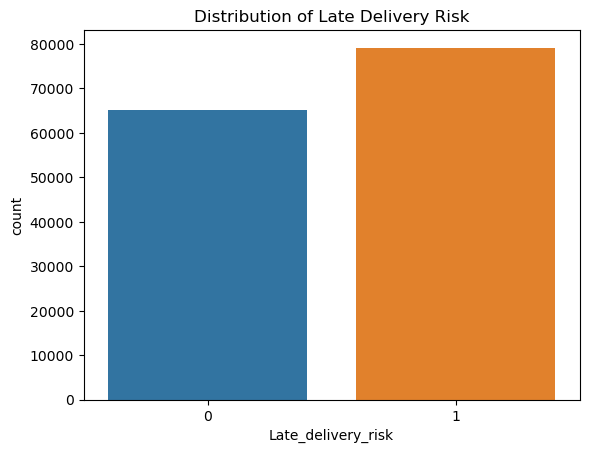

In [22]:
sns.countplot(x='Late_delivery_risk', data=train_data)
plt.title('Distribution of Late Delivery Risk')
plt.show()

##### The data appears reasonably balanced, with the target variable having a near 55:45 ratio between the two classes in both the training and validation sets. Oversampling or undersampling methods are not necessary

In [23]:
print(train_data.columns.tolist())

['Type', 'Days_for_shipping_real', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Sales_per_customer', 'Delivery_Status', 'Late_delivery_risk', 'Category_Id', 'Category_Name', 'Customer_City', 'Customer_Country', 'Customer_Email', 'Customer_Fname', 'Customer_Id', 'Customer_Lname', 'Customer_Password', 'Customer_Segment', 'Customer_State', 'Customer_Street', 'Customer_Zipcode', 'Department_Id', 'Department_Name', 'Latitude', 'Longitude', 'Market', 'Order_City', 'Order_Country', 'Order_Customer_Id', 'order_date_DateOrders', 'Order_Id', 'Order_Item_Cardprod Id', 'Order_Item_Discount', 'Order_item_Discount_Rate', 'Order_Item_Id', 'Order_Item_Product_Price', 'Order_Item_Profit_Ratio', 'Order_Item _Quantity', 'Sales', 'Order_Item_Total', 'Order_Profit_Per_Order', 'Order_Region', 'Order_State', 'Order_Status', 'Product_Card_Id', 'Product_Category_Id', 'Product_Image', 'Product_Name', 'Product_Price', 'Product_Status', 'shipping_date_DateOrders', 'Shipping_Mode']


In [24]:
# Columns to drop
columns_to_drop = ['Customer_Id', 'Order_Customer_Id', 'Order_Item_Id', 'Product_Card_Id',
                   'Customer_Fname', 'Customer_Lname', 'Customer_Email', 'Customer_Password',
                   'Customer_Street', 'Product_Image', 'Category_Id', 'Customer_Zipcode', 'Department_Id',
                   'Order_Id', 'Order_Item_Cardprod Id', 'Order_item_Discount_Rate', 'Order_Item_Profit_Ratio',
                   'Product_Category_Id']

# Dropping unnecessary columns from both training and validation data
train_data = train_data.drop(columns=columns_to_drop)
val_data = val_data.drop(columns=columns_to_drop)

print("Unnecessary columns removed from both training and validation datasets.")

Unnecessary columns removed from both training and validation datasets.


In [25]:
train_data.head().style

,Type,Days_for_shipping_real,Days_for _shipment_scheduled,Benefit_per_order,Sales_per_customer,Delivery_Status,Late_delivery_risk,Category_Name,Customer_City,Customer_Country,Customer_Segment,Customer_State,Department_Name,Latitude,Longitude,Market,Order_City,Order_Country,order_date_DateOrders,Order_Item_Discount,Order_Item_Product_Price,Order_Item _Quantity,Sales,Order_Item_Total,Order_Profit_Per_Order,Order_Region,Order_State,Order_Status,Product_Name,Product_Price,Product_Status,shipping_date_DateOrders,Shipping_Mode
116587,TRANSFER,2,1,1.750000,174.570007,Late delivery,1,Cleats,Los Angeles,EE. UU.,Consumer,CA,Apparel,34.047489,-118.260094,LATAM,Tlaquepaque,FALSE,2015-04-16 16:08:00,5.400000,59.990002,3,179.970001,174.570007,1.750000,Central America,Jalisco,PENDING,Perfect Fitness Perfect Rip Deck,59.990002,0,2015-04-18 16:08:00,First Class
36340,PAYMENT,2,2,38.220001,109.190002,Shipping on time,0,Men's Footwear,Chicago,EE. UU.,Consumer,IL,Apparel,41.713638,-87.712395,Africa,Mbandaka,FALSE,2016-11-12 11:50:00,20.799999,129.990005,1,129.990005,109.190002,38.220001,Central Africa,FALSE,PENDING_PAYMENT,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,2016-11-14 11:50:00,Second Class
175763,DEBIT,2,1,35.099998,129.990005,Late delivery,1,Men's Footwear,Caguas,Puerto Rico,Consumer,PR,Apparel,18.227617,-66.370537,USCA,Houston,Estados Unidos,2016-04-26 07:12:00,1.640000,129.990005,1,129.990005,129.990005,35.099998,US Center,Texas,COMPLETE,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,2016-04-28 07:12:00,First Class
96918,DEBIT,2,1,3.960000,198.000000,Late delivery,1,Women's Apparel,Knoxville,EE. UU.,Home Office,TN,Golf,35.813114,-84.173889,Europe,Bradford,Reino Unido,2017-06-30 15:43:00,2.000000,50.000000,4,200.000000,198.000000,3.960000,Northern Europe,Inglaterra,COMPLETE,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,2017-07-02 15:43:00,First Class
71197,TRANSFER,2,1,5.220000,260.959992,Late delivery,1,Cleats,Cumberland,EE. UU.,Corporate,MD,Apparel,39.653530,-78.763847,Africa,Dar es Salaam,Tanzania,2016-12-18 13:11:00,38.990002,59.990002,5,299.950012,260.959992,5.220000,East Africa,Dar es Salaam,PENDING,Perfect Fitness Perfect Rip Deck,59.990002,0,2016-12-20 13:11:00,First Class


In [26]:
# Check the shape of train_data and test_data
train_shape = train_data.shape
val_shape = val_data.shape

print(f"Training Data Shape: {train_shape} (Rows, Columns)")
print(f"Test Data Shape: {val_shape} (Rows, Columns)")


Training Data Shape: (144415, 33) (Rows, Columns)
Test Data Shape: (36104, 33) (Rows, Columns)


###### We reached 33 columns which was 53 in the beginning by eliminating columns by logic, the feature engineering will be in the next steps

#### 3. EXPLATORY DATA ANALYSIS

In [27]:
# Data summary
print(train_data.describe())
print(train_data.info())


       Days_for_shipping_real  Days_for _shipment_scheduled  \
count           144415.000000                 144415.000000   
mean                 3.579559                      2.985168   
min                  2.000000                      1.000000   
25%                  2.000000                      2.000000   
50%                  3.000000                      4.000000   
75%                  5.000000                      4.000000   
max                  6.000000                      4.000000   
std                  1.498666                      1.274449   

       Benefit_per_order  Sales_per_customer       Latitude      Longitude  \
count      144415.000000       144415.000000  144415.000000  144415.000000   
mean           32.776012          176.348854      29.602607     -84.594888   
min           -49.209999           50.389999      18.226377    -118.260094   
25%             7.040000          104.370003      18.265659     -98.469292   
50%            31.520000          163.9900

c:\Users\User\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


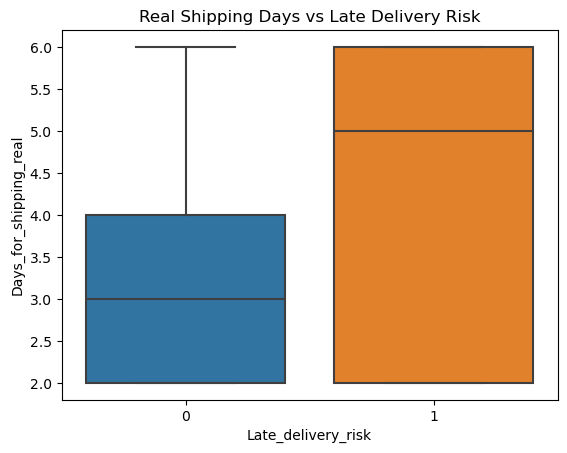

In [28]:
sns.boxplot(x='Late_delivery_risk', y='Days_for_shipping_real', data=train_data)
plt.title('Real Shipping Days vs Late Delivery Risk')
plt.show()

c:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


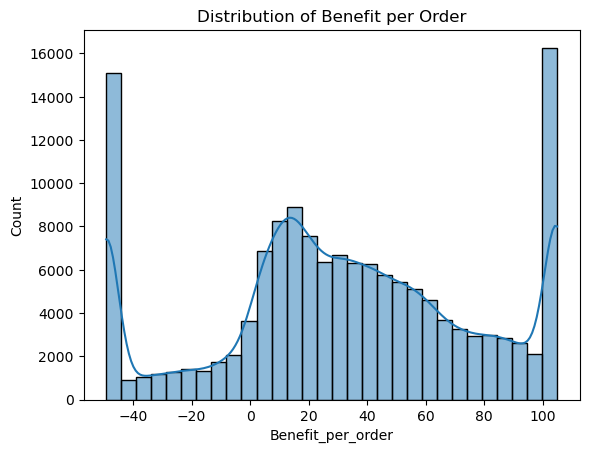

In [29]:
sns.histplot(train_data['Benefit_per_order'], bins=30, kde=True)
plt.title('Distribution of Benefit per Order')
plt.show()

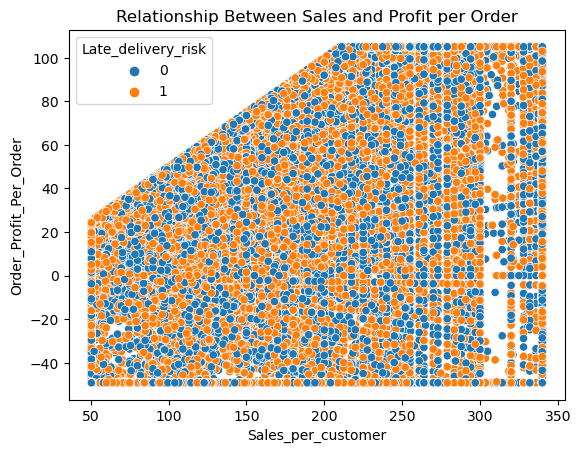

In [30]:
sns.scatterplot(x='Sales_per_customer', y='Order_Profit_Per_Order', hue='Late_delivery_risk', data=train_data)
plt.title('Relationship Between Sales and Profit per Order')
plt.show()

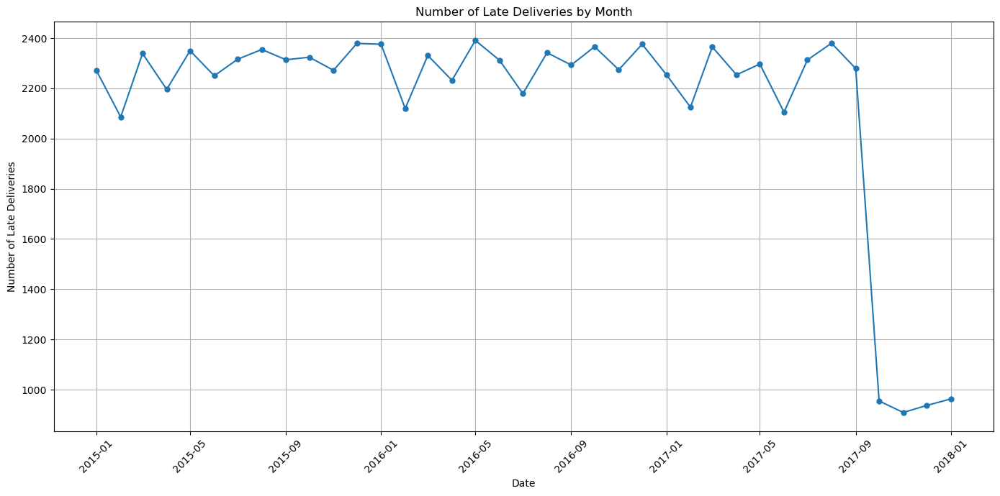

In [31]:
# Assuming 'order_date_DateOrders' is already converted to datetime in your dataset
# Group by month and count late deliveries
late_deliveries_by_month = train_data[train_data['Late_delivery_risk'] == 1].groupby(train_data['order_date_DateOrders'].dt.to_period('M')).size()

# Convert the series to a DataFrame
late_deliveries_by_month = late_deliveries_by_month.reset_index(name='count')
late_deliveries_by_month['order_date_DateOrders'] = late_deliveries_by_month['order_date_DateOrders'].dt.to_timestamp()

# Creating the line plot
plt.figure(figsize=(14, 7))
plt.plot(late_deliveries_by_month['order_date_DateOrders'], late_deliveries_by_month['count'], marker='o', linestyle='-', markersize=5)
plt.title('Number of Late Deliveries by Month')
plt.xlabel('Date')
plt.ylabel('Number of Late Deliveries')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate dates for better visibility
plt.tight_layout()  # Adjust layout to make room for the rotated date labels
plt.show()


##### 
The line plot above illustrates the number of late deliveries by month from early 2015 to early 2018, showing a notable stability in the trend until a precipitous decline starting in late 2017. This sharp drop could be attributed to several potential factors. Firstly, operational improvements within the company, such as enhancements in logistics or deployment of new technology, could have effectively minimized delivery delays. Alternatively, changes in how data was recorded or processed towards the end of the data set might have resulted in fewer incidents of late deliveries being captured. Lastly, external events such as supply chain adjustments or economic shifts could have played a significant role in reducing late delivery instances during this period.

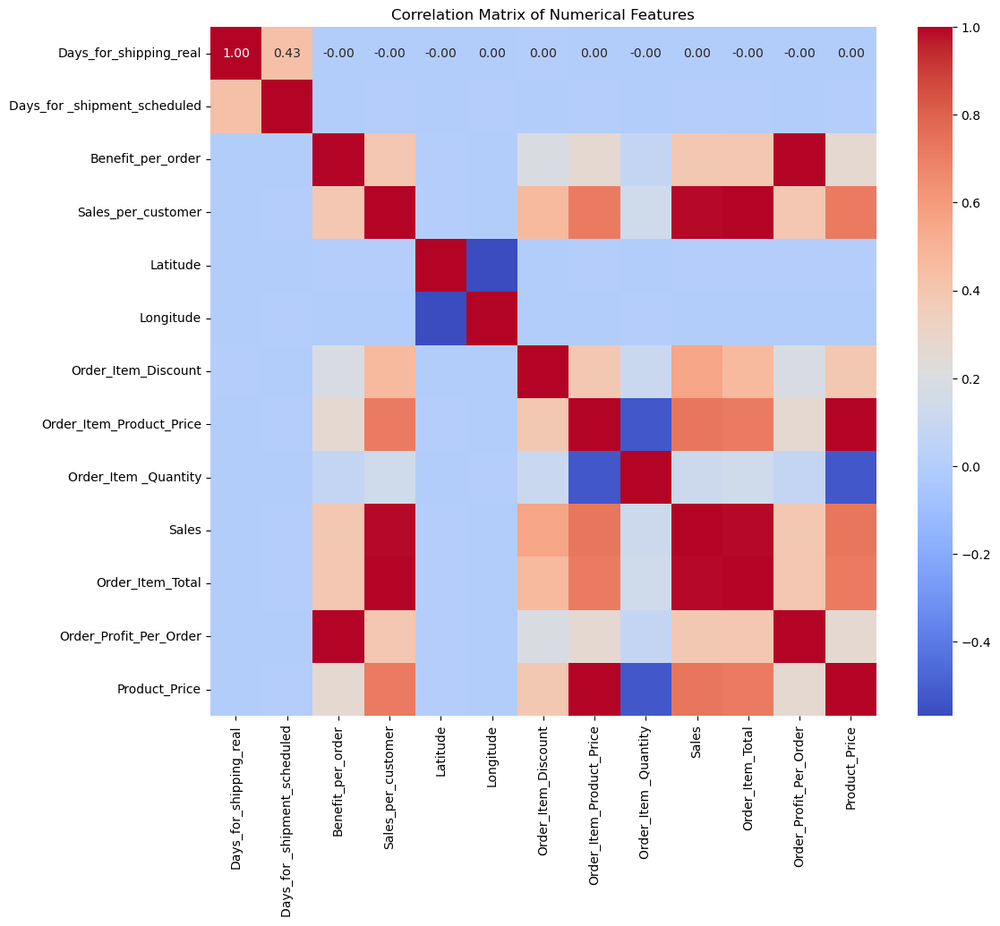

In [32]:
# Compute the correlation matrix for numerical features
corr_matrix = train_data.select_dtypes(include=['float64', 'int64']).corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_2940\1784945378.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  late_deliveries_by_city = train_data.groupby('Customer_City')['Late_delivery_risk'].sum().sort_values(ascending=False)


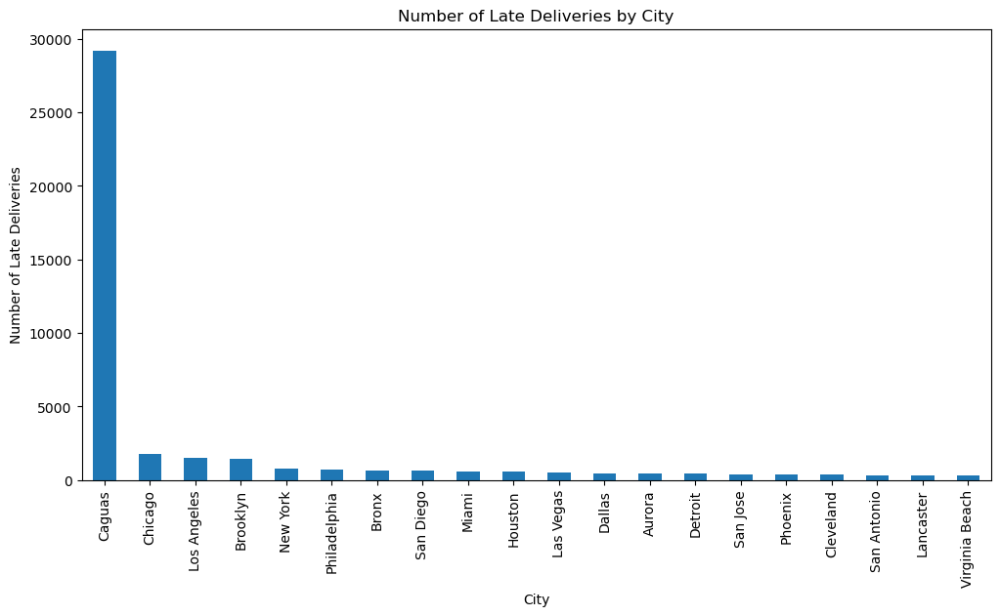

In [33]:
# Ensuring the 'Late_delivery_risk' column is numeric
train_data['Late_delivery_risk'] = pd.to_numeric(train_data['Late_delivery_risk'], errors='coerce')

# Grouping by Customer_City and summing Late_delivery_risk
late_deliveries_by_city = train_data.groupby('Customer_City')['Late_delivery_risk'].sum().sort_values(ascending=False)

# Plotting top 20 cities
plt.figure(figsize=(12, 6))
late_deliveries_by_city.head(20).plot(kind='bar')
plt.title('Number of Late Deliveries by City')
plt.xlabel('City')
plt.ylabel('Number of Late Deliveries')
plt.show()

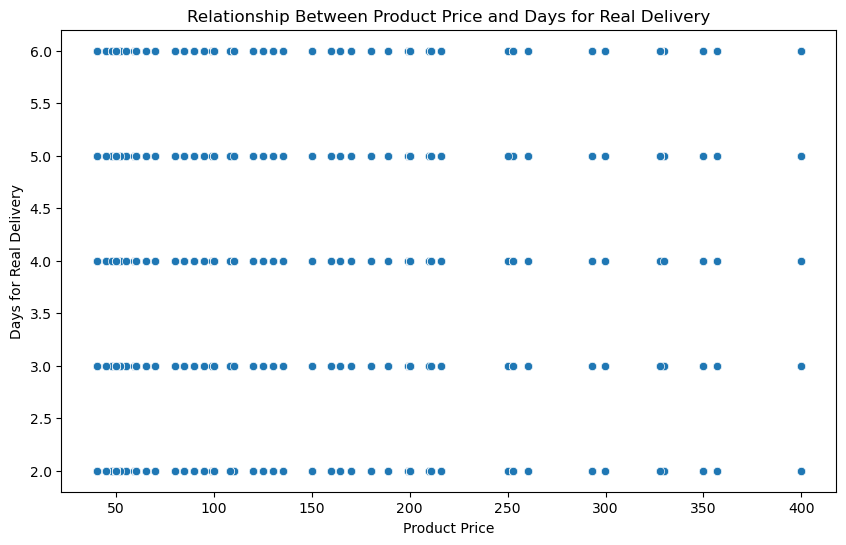

In [34]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Product_Price', y='Days_for_shipping_real', data=train_data)
plt.title('Relationship Between Product Price and Days for Real Delivery')
plt.xlabel('Product Price')
plt.ylabel('Days for Real Delivery')
plt.show()

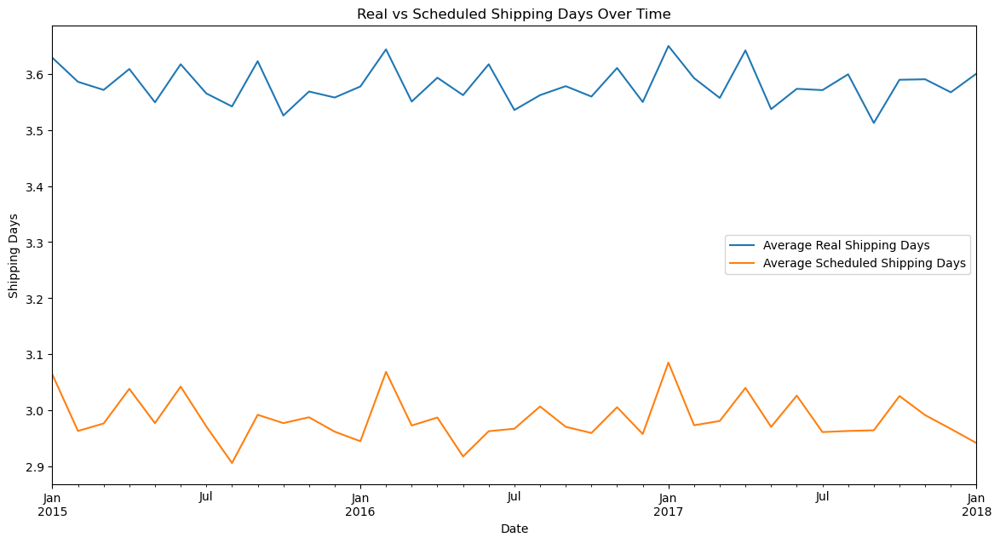

In [35]:
# Assuming there's a date column like 'order_date_DateOrders' to plot over time
train_data['order_date_DateOrders'] = pd.to_datetime(train_data['order_date_DateOrders'])

# Plotting
plt.figure(figsize=(14, 7))
train_data.groupby(train_data['order_date_DateOrders'].dt.to_period('M'))['Days_for_shipping_real'].mean().plot(label='Average Real Shipping Days')
train_data.groupby(train_data['order_date_DateOrders'].dt.to_period('M'))['Days_for _shipment_scheduled'].mean().plot(label='Average Scheduled Shipping Days')
plt.title('Real vs Scheduled Shipping Days Over Time')
plt.xlabel('Date')
plt.ylabel('Shipping Days')
plt.legend()
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_2940\2287041494.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  late_deliveries_by_product = train_data.groupby('Category_Name')['Late_delivery_risk'].sum().sort_values(ascending=False)


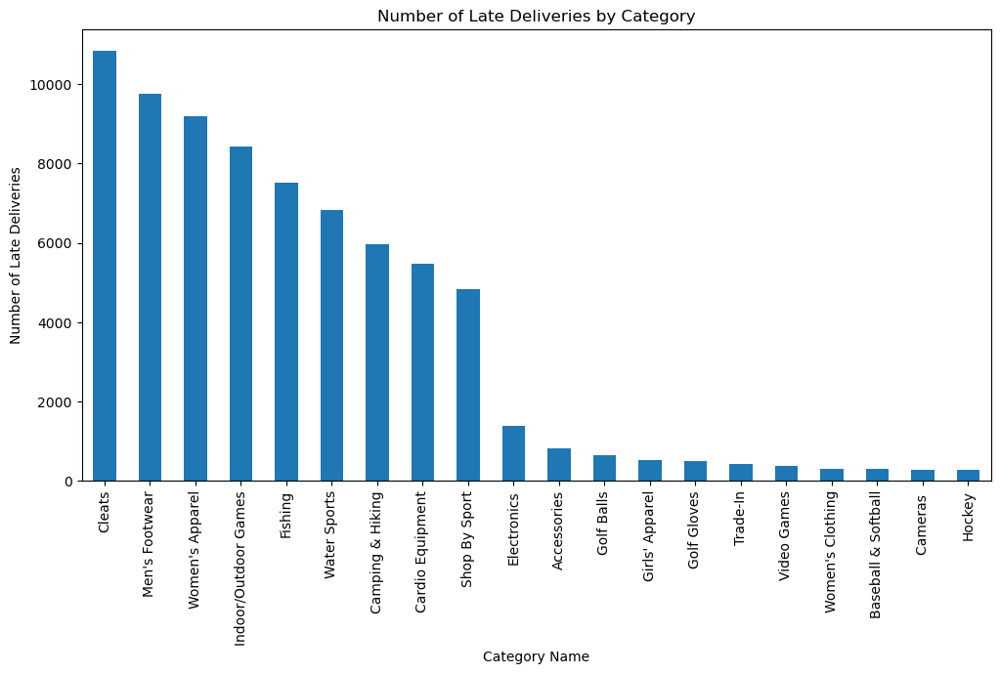

In [36]:
# Grouping by Product_Name and summing Late_delivery_risk
late_deliveries_by_product = train_data.groupby('Category_Name')['Late_delivery_risk'].sum().sort_values(ascending=False)

# Plotting top 20 products
plt.figure(figsize=(12, 6))
late_deliveries_by_product.head(20).plot(kind='bar')
plt.title('Number of Late Deliveries by Category')
plt.xlabel('Category Name')
plt.ylabel('Number of Late Deliveries')
plt.show()

In [37]:
!pip install folium

In [38]:
location_data = train_data[train_data['Late_delivery_risk'] == 1].groupby(['Latitude', 'Longitude']).size().reset_index(name='counts')

In [39]:
import folium

# Create a base map
m = folium.Map(location=[location_data['Latitude'].mean(), location_data['Longitude'].mean()], zoom_start=2)

# Add late delivery counts as circles
for idx, row in location_data.iterrows():
    folium.CircleMarker([row['Latitude'], row['Longitude']],
                        radius=row['counts']/10,  # You might want to scale this appropriately
                        popup='Late Deliveries: {}'.format(row['counts']),
                        color='red',
                        fill=True,
                        fill_color='red'
                       ).add_to(m)

# Display the map
m


#### 4. FEATURE ENGINEERING

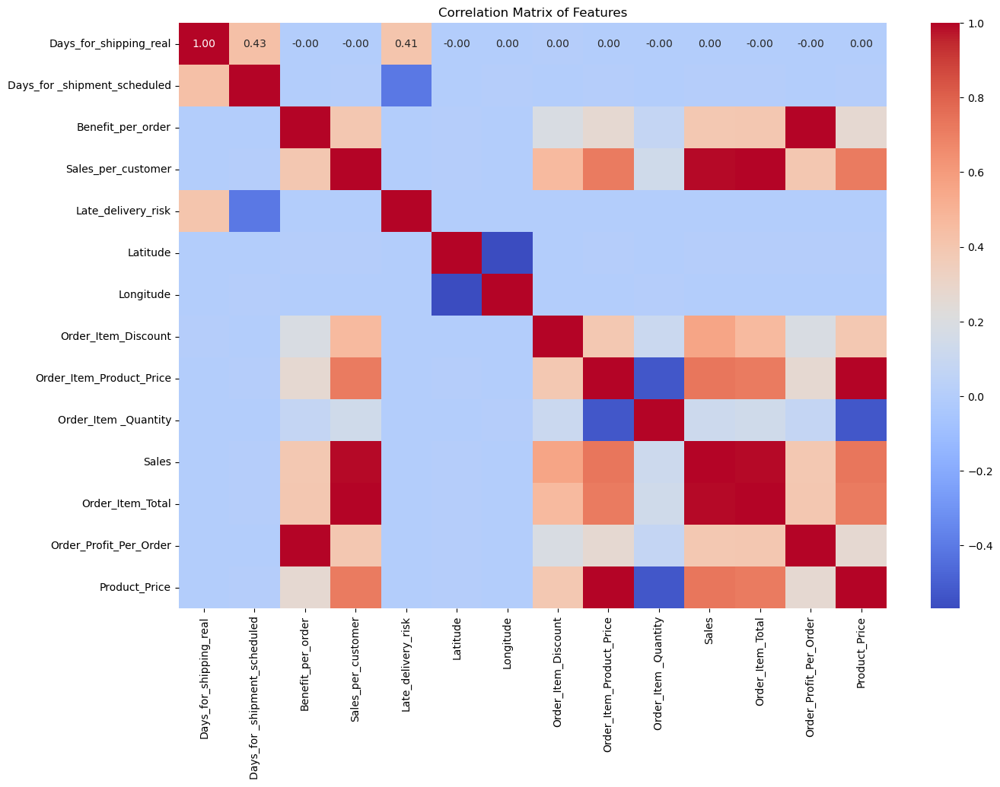

Highly correlated variables: Benefit_per_order and Order_Profit_Per_Order - Correlation: 1.0
Highly correlated variables: Sales_per_customer and Order_Item_Product_Price - Correlation: 0.7155956535753083
Highly correlated variables: Sales_per_customer and Sales - Correlation: 0.9886960576038976
Highly correlated variables: Sales_per_customer and Order_Item_Total - Correlation: 1.0
Highly correlated variables: Sales_per_customer and Product_Price - Correlation: 0.7155956535753083
Highly correlated variables: Order_Item_Product_Price and Sales - Correlation: 0.7359401113988968
Highly correlated variables: Order_Item_Product_Price and Order_Item_Total - Correlation: 0.7155956535753083
Highly correlated variables: Order_Item_Product_Price and Product_Price - Correlation: 1.0
Highly correlated variables: Sales and Order_Item_Total - Correlation: 0.9886960576038976
Highly correlated variables: Sales and Product_Price - Correlation: 0.7359401113988968
Highly correlated variables: Order_Item_T

In [40]:
# Compute the correlation matrix
corr_matrix = train_data.select_dtypes(include=[np.number]).corr()

# Generate a heatmap to visualize the correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Features')
plt.show()

# Identify highly correlated features (threshold > 0.8)
threshold = 0.7
highly_corr_vars = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):  # only consider upper triangle
        if abs(corr_matrix.iloc[i, j]) > threshold:
            highly_corr_vars.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))

# Print the list of highly correlated variable pairs
for var_pair in highly_corr_vars:
    print(f"Highly correlated variables: {var_pair[0]} and {var_pair[1]} - Correlation: {var_pair[2]}")

In [41]:
print(train_data.columns.tolist())
train_data.shape

['Type', 'Days_for_shipping_real', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Sales_per_customer', 'Delivery_Status', 'Late_delivery_risk', 'Category_Name', 'Customer_City', 'Customer_Country', 'Customer_Segment', 'Customer_State', 'Department_Name', 'Latitude', 'Longitude', 'Market', 'Order_City', 'Order_Country', 'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item_Product_Price', 'Order_Item _Quantity', 'Sales', 'Order_Item_Total', 'Order_Profit_Per_Order', 'Order_Region', 'Order_State', 'Order_Status', 'Product_Name', 'Product_Price', 'Product_Status', 'shipping_date_DateOrders', 'Shipping_Mode']


(144415, 33)

In [42]:
# Removing highly correlated variables because of the Multicollinearity Problem
columns_to_remove = ['Order_Profit_Per_Order', 'Sales_per_customer', 'Order_Item_Product_Price', "Order_Item_Total"]

# Drop these columns from both training and validation datasets
train_data.drop(columns=columns_to_remove, inplace=True)
val_data.drop(columns=columns_to_remove, inplace=True)

print("Columns removed from both train and val datasets.")

Columns removed from both train and val datasets.


In [43]:
print(train_data.columns.tolist())


['Type', 'Days_for_shipping_real', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Delivery_Status', 'Late_delivery_risk', 'Category_Name', 'Customer_City', 'Customer_Country', 'Customer_Segment', 'Customer_State', 'Department_Name', 'Latitude', 'Longitude', 'Market', 'Order_City', 'Order_Country', 'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Order_Region', 'Order_State', 'Order_Status', 'Product_Name', 'Product_Price', 'Product_Status', 'shipping_date_DateOrders', 'Shipping_Mode']


In [44]:
train_data.shape

(144415, 29)

In [45]:
val_data.shape

(36104, 29)

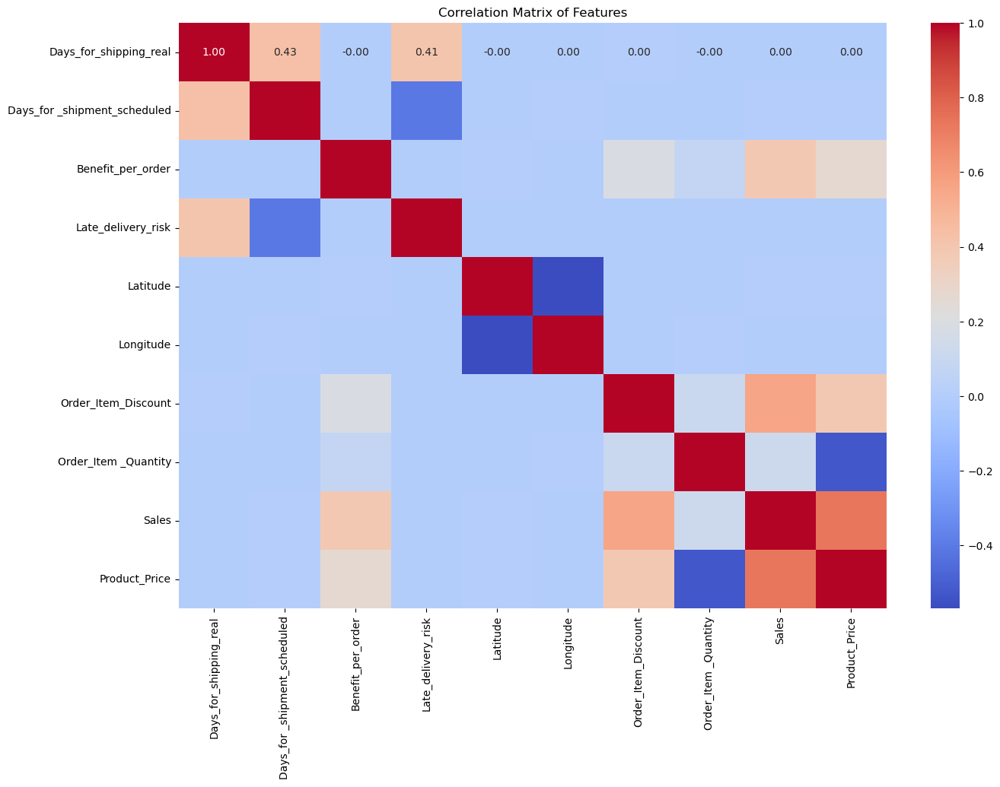

In [46]:
# Compute the correlation matrix
corr_matrix = train_data.select_dtypes(include=[np.number]).corr()

# Generate a heatmap to visualize the correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Features')
plt.show()

In [47]:
train_data.head().style

,Type,Days_for_shipping_real,Days_for _shipment_scheduled,Benefit_per_order,Delivery_Status,Late_delivery_risk,Category_Name,Customer_City,Customer_Country,Customer_Segment,Customer_State,Department_Name,Latitude,Longitude,Market,Order_City,Order_Country,order_date_DateOrders,Order_Item_Discount,Order_Item _Quantity,Sales,Order_Region,Order_State,Order_Status,Product_Name,Product_Price,Product_Status,shipping_date_DateOrders,Shipping_Mode
116587,TRANSFER,2,1,1.750000,Late delivery,1,Cleats,Los Angeles,EE. UU.,Consumer,CA,Apparel,34.047489,-118.260094,LATAM,Tlaquepaque,FALSE,2015-04-16 16:08:00,5.400000,3,179.970001,Central America,Jalisco,PENDING,Perfect Fitness Perfect Rip Deck,59.990002,0,2015-04-18 16:08:00,First Class
36340,PAYMENT,2,2,38.220001,Shipping on time,0,Men's Footwear,Chicago,EE. UU.,Consumer,IL,Apparel,41.713638,-87.712395,Africa,Mbandaka,FALSE,2016-11-12 11:50:00,20.799999,1,129.990005,Central Africa,FALSE,PENDING_PAYMENT,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,2016-11-14 11:50:00,Second Class
175763,DEBIT,2,1,35.099998,Late delivery,1,Men's Footwear,Caguas,Puerto Rico,Consumer,PR,Apparel,18.227617,-66.370537,USCA,Houston,Estados Unidos,2016-04-26 07:12:00,1.640000,1,129.990005,US Center,Texas,COMPLETE,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,2016-04-28 07:12:00,First Class
96918,DEBIT,2,1,3.960000,Late delivery,1,Women's Apparel,Knoxville,EE. UU.,Home Office,TN,Golf,35.813114,-84.173889,Europe,Bradford,Reino Unido,2017-06-30 15:43:00,2.000000,4,200.000000,Northern Europe,Inglaterra,COMPLETE,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,2017-07-02 15:43:00,First Class
71197,TRANSFER,2,1,5.220000,Late delivery,1,Cleats,Cumberland,EE. UU.,Corporate,MD,Apparel,39.653530,-78.763847,Africa,Dar es Salaam,Tanzania,2016-12-18 13:11:00,38.990002,5,299.950012,East Africa,Dar es Salaam,PENDING,Perfect Fitness Perfect Rip Deck,59.990002,0,2016-12-20 13:11:00,First Class


In [48]:
# Display data types of all columns in the DataFrame
print(train_data.dtypes)

Type                                  category
Days_for_shipping_real                   int64
Days_for _shipment_scheduled             int64
Benefit_per_order                      float64
Delivery_Status                       category
Late_delivery_risk                       int64
Category_Name                         category
Customer_City                         category
Customer_Country                      category
Customer_Segment                      category
Customer_State                        category
Department_Name                       category
Latitude                               float64
Longitude                              float64
Market                                category
Order_City                            category
Order_Country                         category
order_date_DateOrders           datetime64[ns]
Order_Item_Discount                    float64
Order_Item _Quantity                     int64
Sales                                  float64
Order_Region 

In [49]:
# For categorical variables, display the number of unique values
categorical_columns = train_data.select_dtypes(include=['object', 'category']).columns
for column in categorical_columns:
    print(f"{column}: {train_data[column].nunique()} unique levels")

Type: 4 unique levels
Delivery_Status: 4 unique levels
Category_Name: 50 unique levels
Customer_City: 563 unique levels
Customer_Country: 2 unique levels
Customer_Segment: 3 unique levels
Customer_State: 46 unique levels
Department_Name: 11 unique levels
Market: 5 unique levels
Order_City: 3343 unique levels
Order_Country: 122 unique levels
Order_Region: 23 unique levels
Order_State: 881 unique levels
Order_Status: 9 unique levels
Product_Name: 118 unique levels
Product_Status: 1 unique levels
Shipping_Mode: 4 unique levels


In [50]:
def apply_top_categories(df, columns, top_n=4):
    for column_name in columns:
        # Get the top n most frequent categories excluding 'FALSE'
        top_n_categories = df[column_name].replace("FALSE", pd.NA).value_counts().nlargest(top_n).index
        
        # Replace less frequent categories and 'FALSE' with 'Others' directly in the column
        df[column_name] = df[column_name].apply(lambda x: x if x in top_n_categories and x != "FALSE" else 'Others')
    return df

# List of columns to apply this transformation
columns = ['Order_City', 'Order_State', 'Customer_City', 'Order_Country', 
           'Product_Name', 'Category_Name', 'Customer_State', 'Order_Region']

# Apply the transformation directly to the existing columns in train_data and val_data
train_data = apply_top_categories(train_data, columns, top_n=4)
val_data = apply_top_categories(val_data, columns, top_n=4)

In [51]:
# For categorical variables, display the number of unique values
categorical_columns = train_data.select_dtypes(include=['object', 'category']).columns
for column in categorical_columns:
    print(f"{column}: {train_data[column].nunique()} unique levels")

Type: 4 unique levels
Delivery_Status: 4 unique levels
Category_Name: 5 unique levels
Customer_City: 5 unique levels
Customer_Country: 2 unique levels
Customer_Segment: 3 unique levels
Customer_State: 5 unique levels
Department_Name: 11 unique levels
Market: 5 unique levels
Order_City: 5 unique levels
Order_Country: 5 unique levels
Order_Region: 5 unique levels
Order_State: 5 unique levels
Order_Status: 9 unique levels
Product_Name: 5 unique levels
Product_Status: 1 unique levels
Shipping_Mode: 4 unique levels


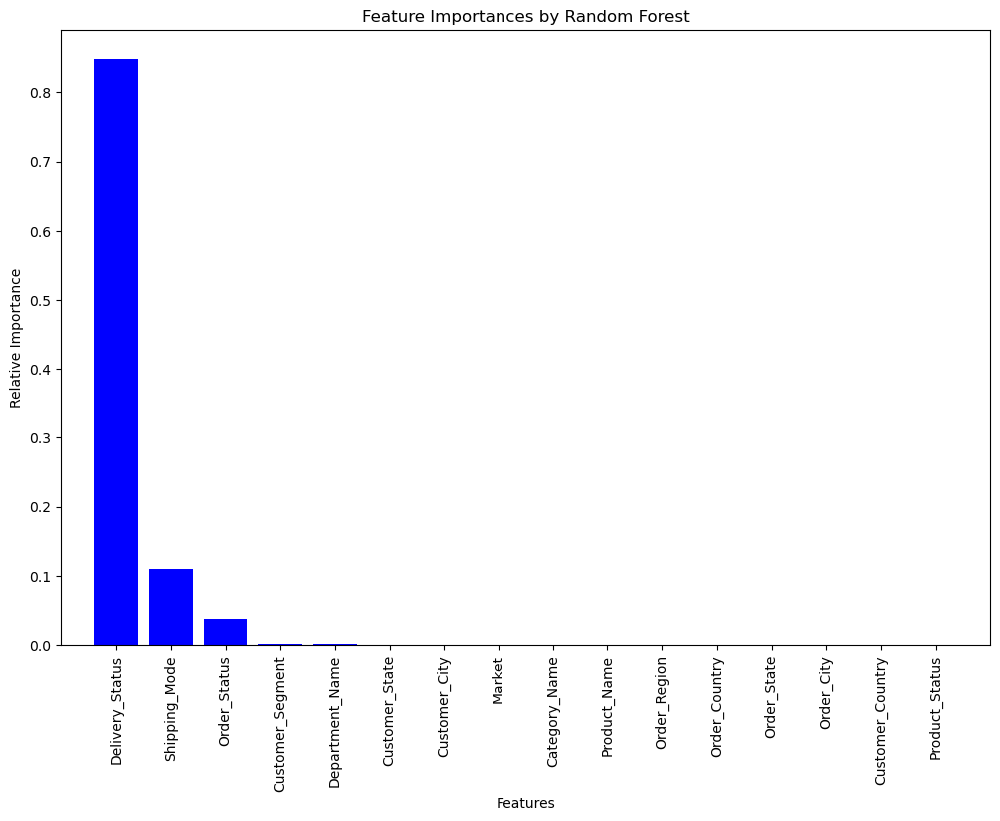

In [52]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming 'train_data' and 'val_data' are your DataFrames
target_column_name = 'Late_delivery_risk'  # Replace with your actual target column name

# Define train_labels and val_labels as the target variable from the DataFrame
train_labels = train_data[target_column_name]
val_labels = val_data[target_column_name]

# Define all categorical columns as per your dataset details
categorical_columns = [
    'Delivery_Status', 'Category_Name', 'Customer_City', 'Customer_Country', 
    'Customer_Segment', 'Customer_State', 'Department_Name', 'Market', 
    'Order_City', 'Order_Country', 'Order_Region', 'Order_State', 
    'Order_Status', 'Product_Name', 'Product_Status', 'Shipping_Mode'
]

# Initialize a dictionary to hold LabelEncoders for each categorical column
label_encoders = {}

# Apply label encoding to both training and validation data
for column in categorical_columns:
    le = LabelEncoder()
    # Combine data to fit
    combined = pd.concat([train_data[column], val_data[column]], axis=0).astype(str)
    le.fit(combined)
    train_data[column] = le.transform(train_data[column].astype(str))
    val_data[column] = le.transform(val_data[column].astype(str))
    label_encoders[column] = le  # Store the label encoder for potential inverse transformation

# Create modified data copies for training
train_data_modified = train_data.copy()
val_data_modified = val_data.copy()

# Fit Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(train_data_modified[categorical_columns], train_labels)

# Get feature importances
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12, 8))
plt.title('Feature Importances by Random Forest')
plt.bar(range(len(indices)), importances[indices], color='b', align='center')
plt.xticks(range(len(indices)), [categorical_columns[i] for i in indices], rotation=90)
plt.xlim([-1, len(indices)])
plt.ylabel('Relative Importance')
plt.xlabel('Features')
plt.show()


### if above works , delete code below   

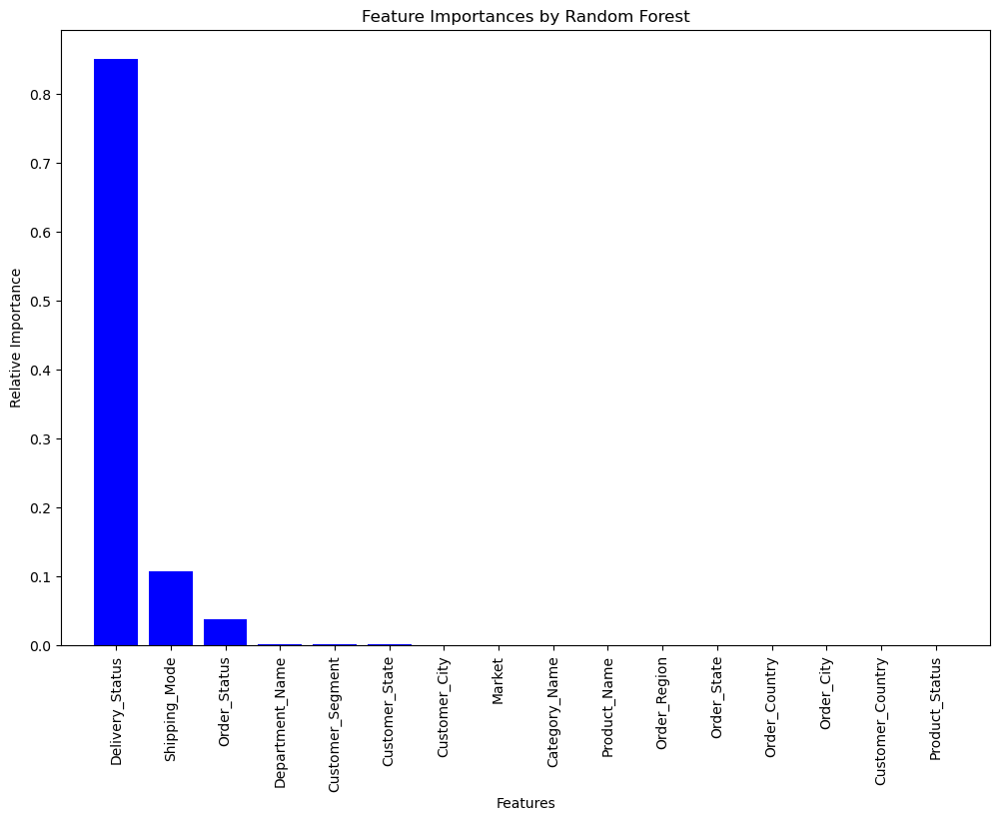

In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming 'train_data' is your DataFrame
# Replace 'Late_delivery_risk' with the actual target column name in your dataset
target_column_name = 'Late_delivery_risk'  # Change this to your actual target column name

# Define train_labels as the target variable from the DataFrame
train_labels = train_data[target_column_name]

# Define all categorical columns as per your dataset details
categorical_columns = [
    'Delivery_Status', 'Category_Name', 'Customer_City', 'Customer_Country', 
    'Customer_Segment', 'Customer_State', 'Department_Name', 'Market', 
    'Order_City', 'Order_Country', 'Order_Region', 'Order_State', 
    'Order_Status', 'Product_Name', 'Product_Status', 'Shipping_Mode'
]

# Initialize a dictionary to hold LabelEncoders for each categorical column
label_encoders = {}

# Label encode each categorical variable
for column in categorical_columns:
    le = LabelEncoder()
    train_data[column] = le.fit_transform(train_data[column].astype(str))
    label_encoders[column] = le  # Store the label encoder for potential inverse transformation

# Fit Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(train_data[categorical_columns], train_labels)  # Use only the categorical columns for fitting

# Get feature importances
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12, 8))
plt.title('Feature Importances by Random Forest')
plt.bar(range(len(indices)), importances[indices], color='b', align='center')
plt.xticks(range(len(indices)), [categorical_columns[i] for i in indices], rotation=90)
plt.xlim([-1, len(indices)])
plt.ylabel('Relative Importance')
plt.xlabel('Features')
plt.show()


In [54]:
# List of columns to remove based on your feature importance analysis and to prevent data leakage
columns_to_remove = [
    'Customer_City', 'Market', 'Category_Name', 'Product_Name', 
    'Order_Region', 'Order_State', 'Order_Country', 'Customer_State', 
    'Customer_Country', 'Product_Status', 'Delivery_Status'  # Including Delivery_Status to avoid data leakage
]

# Remove these columns from train_data and val_data
train_data.drop(columns=columns_to_remove, inplace=True)
val_data.drop(columns=columns_to_remove, inplace=True)

# Print the updated DataFrame columns to confirm removal
print("Updated train_data columns:", train_data.columns)
print("Updated val_data columns:", val_data.columns)


Updated train_data columns: Index(['Type', 'Days_for_shipping_real', 'Days_for _shipment_scheduled',
       'Benefit_per_order', 'Late_delivery_risk', 'Customer_Segment',
       'Department_Name', 'Latitude', 'Longitude', 'Order_City',
       'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item _Quantity',
       'Sales', 'Order_Status', 'Product_Price', 'shipping_date_DateOrders',
       'Shipping_Mode'],
      dtype='object')
Updated val_data columns: Index(['Type', 'Days_for_shipping_real', 'Days_for _shipment_scheduled',
       'Benefit_per_order', 'Late_delivery_risk', 'Customer_Segment',
       'Department_Name', 'Latitude', 'Longitude', 'Order_City',
       'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item _Quantity',
       'Sales', 'Order_Status', 'Product_Price', 'shipping_date_DateOrders',
       'Shipping_Mode'],
      dtype='object')


In [55]:
train_data.shape


(144415, 18)

In [56]:
val_data.shape

(36104, 18)

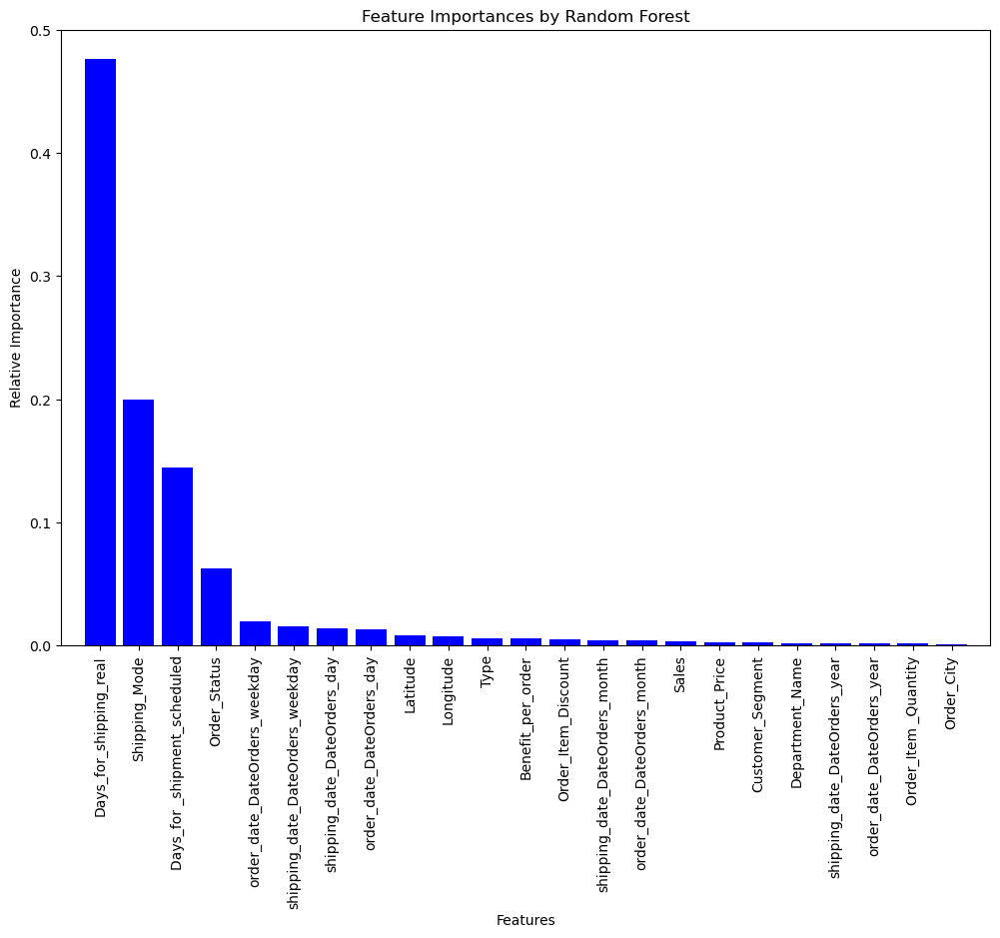

In [57]:
# Assuming 'train_data' is your DataFrame
target = 'Late_delivery_risk'
train_labels = train_data[target]
train_features = train_data.drop(columns=[target])

# Initialize LabelEncoder
le = LabelEncoder()

# Convert all categorical columns to numeric by label encoding
for column in train_features.columns:
    if train_features[column].dtype == 'object' or train_features[column].dtype.name == 'category':
        train_features[column] = le.fit_transform(train_features[column].astype(str))
    elif train_features[column].dtype == 'datetime64[ns]':
        # Extracting date features
        train_features[f'{column}_year'] = train_features[column].dt.year
        train_features[f'{column}_month'] = train_features[column].dt.month
        train_features[f'{column}_day'] = train_features[column].dt.day
        train_features[f'{column}_weekday'] = train_features[column].dt.weekday
        # After extraction, drop the original datetime column
        train_features.drop(columns=[column], inplace=True)

# Fit Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(train_features, train_labels)

# Get feature importances
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12, 8))
plt.title('Feature Importances by Random Forest')
plt.bar(range(train_features.shape[1]), importances[indices], color='b', align='center')
plt.xticks(range(train_features.shape[1]), train_features.columns[indices], rotation=90)
plt.xlim([-1, train_features.shape[1]])
plt.ylabel('Relative Importance')
plt.xlabel('Features')
plt.show()

In [58]:
# Columns to be removed to prevent data leakage
columns_to_remove = ['Days_for_shipping_real', 'shipping_date_DateOrders']

# Removing the specified columns from both training and validation data
train_data.drop(columns=columns_to_remove, inplace=True)
val_data.drop(columns=columns_to_remove, inplace=True)

# Optionally, print the remaining columns to confirm removal
print("Updated train_data columns:", train_data.columns)
print("Updated val_data columns:", val_data.columns)


Updated train_data columns: Index(['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order',
       'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude',
       'Longitude', 'Order_City', 'order_date_DateOrders',
       'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Order_Status',
       'Product_Price', 'Shipping_Mode'],
      dtype='object')
Updated val_data columns: Index(['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order',
       'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude',
       'Longitude', 'Order_City', 'order_date_DateOrders',
       'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Order_Status',
       'Product_Price', 'Shipping_Mode'],
      dtype='object')


In [59]:
# Additional columns to be removed to prevent data leakage and due to potential direct indication of the target
additional_columns_to_remove = ['Order_Status']

# Removing the specified additional columns from both training and validation data
train_data.drop(columns=additional_columns_to_remove, inplace=True)
val_data.drop(columns=additional_columns_to_remove, inplace=True)

# Optionally, print the remaining columns to confirm removal
print("Updated train_data columns after further removal:", train_data.columns)
print("Updated val_data columns after further removal:", val_data.columns)

Updated train_data columns after further removal: Index(['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order',
       'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude',
       'Longitude', 'Order_City', 'order_date_DateOrders',
       'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Product_Price',
       'Shipping_Mode'],
      dtype='object')
Updated val_data columns after further removal: Index(['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order',
       'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude',
       'Longitude', 'Order_City', 'order_date_DateOrders',
       'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Product_Price',
       'Shipping_Mode'],
      dtype='object')


In [60]:
train_data.head().style

,Type,Days_for _shipment_scheduled,Benefit_per_order,Late_delivery_risk,Customer_Segment,Department_Name,Latitude,Longitude,Order_City,order_date_DateOrders,Order_Item_Discount,Order_Item _Quantity,Sales,Product_Price,Shipping_Mode
116587,TRANSFER,1,1.750000,1,0,0,34.047489,-118.260094,2,2015-04-16 16:08:00,5.400000,3,179.970001,59.990002,0
36340,PAYMENT,2,38.220001,0,0,0,41.713638,-87.712395,2,2016-11-12 11:50:00,20.799999,1,129.990005,129.990005,2
175763,DEBIT,1,35.099998,1,0,0,18.227617,-66.370537,2,2016-04-26 07:12:00,1.640000,1,129.990005,129.990005,0
96918,DEBIT,1,3.960000,1,2,7,35.813114,-84.173889,2,2017-06-30 15:43:00,2.000000,4,200.000000,50.000000,0
71197,TRANSFER,1,5.220000,1,1,0,39.653530,-78.763847,2,2016-12-18 13:11:00,38.990002,5,299.950012,59.990002,0


In [61]:
!pip install statsmodels

In [62]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Assuming 'train_data' is your DataFrame
target_column_name = 'Late_delivery_risk'

# Separate labels and features
train_labels = train_data[target_column_name]
train_features = train_data.drop(columns=[target_column_name])

# Check initial size of data
print("Initial size - features:", train_features.shape, "labels:", train_labels.shape)

# Convert all features to numeric and handle any potential issues with NaNs
for column in train_features.columns:
    train_features[column] = pd.to_numeric(train_features[column], errors='coerce')

# Instead of dropping all rows with NaNs, fill NaNs
train_features.fillna(train_features.mean(), inplace=True)  # Fill NaNs with the mean of each column

# Ensure no entire column is NaN which might occur if a column had all NaNs
train_features.dropna(axis=1, how='all', inplace=True)

# Realign train_labels to match train_features after NaN handling
train_labels = train_labels.reindex(train_features.index)

# Adding a constant to the model for the intercept
train_features = sm.add_constant(train_features)

# Check final size of data
print("Final size - features:", train_features.shape, "labels:", train_labels.shape)

# Fit logistic regression model
try:
    model = sm.Logit(train_labels, train_features)
    result = model.fit()
    print(result.summary())
except Exception as e:
    print("An error occurred during model fitting:", str(e))

Initial size - features: (144415, 14) labels: (144415,)
Final size - features: (144415, 14) labels: (144415,)
Optimization terminated successfully.
         Current function value: 0.594755
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:     Late_delivery_risk   No. Observations:               144415
Model:                          Logit   Df Residuals:                   144401
Method:                           MLE   Df Model:                           13
Date:                Sun, 22 Dec 2024   Pseudo R-squ.:                  0.1361
Time:                        14:01:49   Log-Likelihood:                -85892.
converged:                       True   LL-Null:                       -99427.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

In [63]:
print(train_data.columns.tolist())

['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude', 'Longitude', 'Order_City', 'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Product_Price', 'Shipping_Mode']


In [64]:
# Removing the 'Order_City' column from both training and validation datasets
train_data.drop(columns=['Order_City'], inplace=True)
val_data.drop(columns=['Order_City'], inplace=True)

# Optionally, print the remaining columns to confirm removal
print("Updated train_data columns:", train_data.columns)
print("Updated val_data columns:", val_data.columns)

Updated train_data columns: Index(['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order',
       'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude',
       'Longitude', 'order_date_DateOrders', 'Order_Item_Discount',
       'Order_Item _Quantity', 'Sales', 'Product_Price', 'Shipping_Mode'],
      dtype='object')
Updated val_data columns: Index(['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order',
       'Late_delivery_risk', 'Customer_Segment', 'Department_Name', 'Latitude',
       'Longitude', 'order_date_DateOrders', 'Order_Item_Discount',
       'Order_Item _Quantity', 'Sales', 'Product_Price', 'Shipping_Mode'],
      dtype='object')


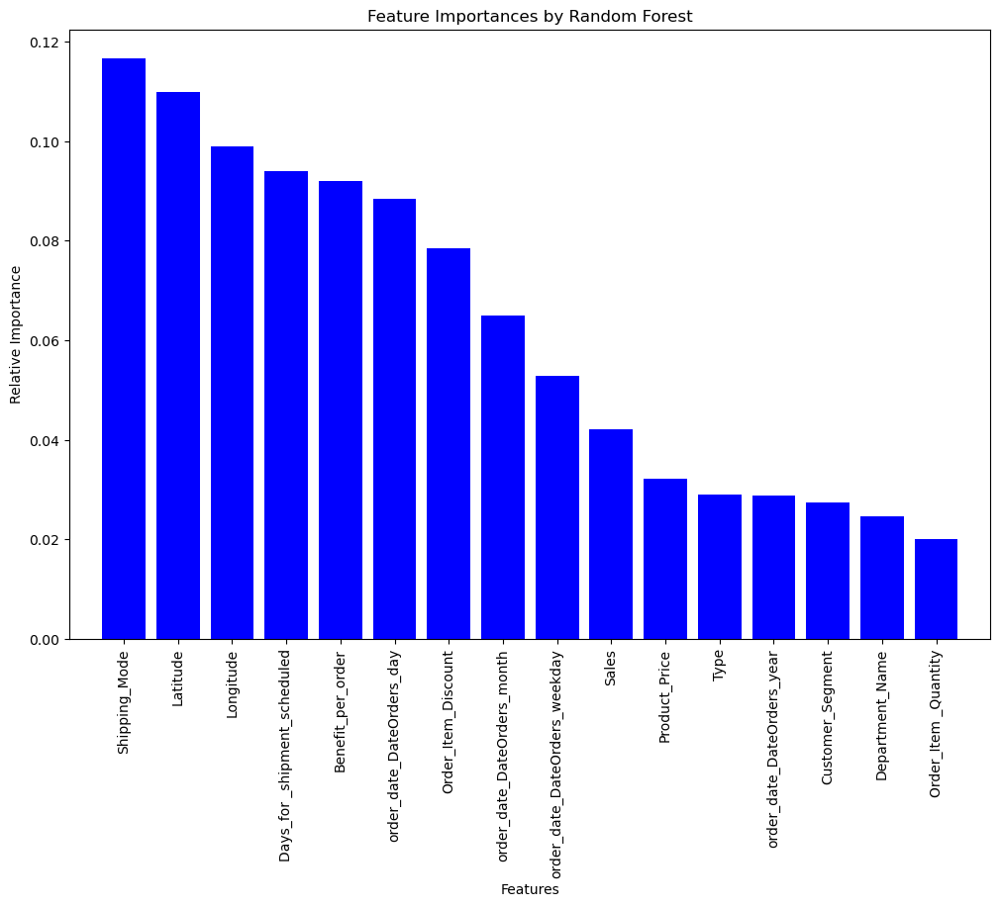

In [65]:
# Assuming 'train_data' is your DataFrame
target = 'Late_delivery_risk'
train_labels = train_data[target]
train_features = train_data.drop(columns=[target])

# Initialize LabelEncoder
le = LabelEncoder()

# Convert all categorical columns to numeric by label encoding
for column in train_features.columns:
    if train_features[column].dtype == 'object' or train_features[column].dtype.name == 'category':
        train_features[column] = le.fit_transform(train_features[column].astype(str))
    elif train_features[column].dtype == 'datetime64[ns]':
        # Extracting date features
        train_features[f'{column}_year'] = train_features[column].dt.year
        train_features[f'{column}_month'] = train_features[column].dt.month
        train_features[f'{column}_day'] = train_features[column].dt.day
        train_features[f'{column}_weekday'] = train_features[column].dt.weekday
        # After extraction, drop the original datetime column
        train_features.drop(columns=[column], inplace=True)

# Fit Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(train_features, train_labels)

# Get feature importances
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12, 8))
plt.title('Feature Importances by Random Forest')
plt.bar(range(train_features.shape[1]), importances[indices], color='b', align='center')
plt.xticks(range(train_features.shape[1]), train_features.columns[indices], rotation=90)
plt.xlim([-1, train_features.shape[1]])
plt.ylabel('Relative Importance')
plt.xlabel('Features')
plt.show()

In [66]:
train_data.shape

(144415, 14)

In [67]:
val_data.shape

(36104, 14)

In [68]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Assuming 'train_data' is your DataFrame
target_column_name = 'Late_delivery_risk'

# Separate labels and features
train_labels = train_data[target_column_name]
train_features = train_data.drop(columns=[target_column_name])

# Check initial size of data
print("Initial size - features:", train_features.shape, "labels:", train_labels.shape)

# Convert all features to numeric and handle any potential issues with NaNs
for column in train_features.columns:
    train_features[column] = pd.to_numeric(train_features[column], errors='coerce')

# Instead of dropping all rows with NaNs, fill NaNs
train_features.fillna(train_features.mean(), inplace=True)  # Fill NaNs with the mean of each column

# Ensure no entire column is NaN which might occur if a column had all NaNs
train_features.dropna(axis=1, how='all', inplace=True)

# Realign train_labels to match train_features after NaN handling
train_labels = train_labels.reindex(train_features.index)

# Adding a constant to the model for the intercept
train_features = sm.add_constant(train_features)

# Check final size of data
print("Final size - features:", train_features.shape, "labels:", train_labels.shape)

# Fit logistic regression model
try:
    model = sm.Logit(train_labels, train_features)
    result = model.fit()
    print(result.summary())
except Exception as e:
    print("An error occurred during model fitting:", str(e))

Initial size - features: (144415, 13) labels: (144415,)
Final size - features: (144415, 13) labels: (144415,)
Optimization terminated successfully.
         Current function value: 0.594763
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:     Late_delivery_risk   No. Observations:               144415
Model:                          Logit   Df Residuals:                   144402
Method:                           MLE   Df Model:                           12
Date:                Sun, 22 Dec 2024   Pseudo R-squ.:                  0.1361
Time:                        14:02:15   Log-Likelihood:                -85893.
converged:                       True   LL-Null:                       -99427.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

In [69]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Assuming 'train_data' is your DataFrame
target_column_name = 'Late_delivery_risk'

# Separate labels and features
train_labels = train_data[target_column_name]
train_features = train_data.drop(columns=[target_column_name])

# Check initial size of data
print("Initial size - features:", train_features.shape, "labels:", train_labels.shape)

# Convert all features to numeric and handle any potential issues with NaNs
for column in train_features.columns:
    train_features[column] = pd.to_numeric(train_features[column], errors='coerce')

# Instead of dropping all rows with NaNs, fill NaNs
train_features.fillna(train_features.mean(), inplace=True)  # Fill NaNs with the mean of each column

# Ensure no entire column is NaN which might occur if a column had all NaNs
train_features.dropna(axis=1, how='all', inplace=True)

# Realign train_labels to match train_features after NaN handling
train_labels = train_labels.reindex(train_features.index)

# Adding a constant to the model for the intercept
train_features = sm.add_constant(train_features)

# Check final size of data
print("Final size - features:", train_features.shape, "labels:", train_labels.shape)

# Fit logistic regression model
try:
    model = sm.Logit(train_labels, train_features)
    result = model.fit()
    print(result.summary())
except Exception as e:
    print("An error occurred during model fitting:", str(e))

Initial size - features: (144415, 13) labels: (144415,)
Final size - features: (144415, 13) labels: (144415,)
Optimization terminated successfully.
         Current function value: 0.594763
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:     Late_delivery_risk   No. Observations:               144415
Model:                          Logit   Df Residuals:                   144402
Method:                           MLE   Df Model:                           12
Date:                Sun, 22 Dec 2024   Pseudo R-squ.:                  0.1361
Time:                        14:02:16   Log-Likelihood:                -85893.
converged:                       True   LL-Null:                       -99427.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------

In [70]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Assuming 'train_data' is your DataFrame and 'Late_delivery_risk' is the target
target_column_name = 'Late_delivery_risk'

# Separate labels and features
train_labels = train_data[target_column_name]
train_features = train_data.drop(columns=[target_column_name])

# Display initial data sizes
print("Initial data size - Features:", train_features.shape, "Labels:", train_labels.shape)

# Convert all features to numeric, handle missing data by filling with the mean
for column in train_features.columns:
    if train_features[column].dtype == 'object':
        train_features[column] = train_features[column].astype('category').cat.codes
    train_features[column] = pd.to_numeric(train_features[column], errors='coerce')

# Fill NaNs with the mean of each column
train_features.fillna(train_features.mean(), inplace=True)

# Ensure there are no columns that are entirely NaN, which could occur if a column had non-numeric types
train_features.dropna(axis=1, how='all', inplace=True)

# Align train_labels to match the cleaned and processed train_features
train_labels = train_labels.reindex(train_features.index).dropna()

# Adding a constant to the model for the intercept
train_features = sm.add_constant(train_features)

# Display final data sizes
print("Final data size - Features:", train_features.shape, "Labels:", train_labels.shape)

# Fit logistic regression model
try:
    model = sm.Logit(train_labels, train_features)
    result = model.fit()
    print(result.summary2())
except Exception as e:
    print("An error occurred during model fitting:", str(e))

Initial data size - Features: (144415, 13) Labels: (144415,)
Final data size - Features: (144415, 13) Labels: (144415,)
Optimization terminated successfully.
         Current function value: 0.594763
         Iterations 6
                               Results: Logit
Model:                 Logit                 Method:              MLE        
Dependent Variable:    Late_delivery_risk    Pseudo R-squared:    0.136      
Date:                  2024-12-22 14:02      AIC:                 171811.5354
No. Observations:      144415                BIC:                 171939.9812
Df Model:              12                    Log-Likelihood:      -85893.    
Df Residuals:          144402                LL-Null:             -99427.    
Converged:             1.0000                LLR p-value:         0.0000     
No. Iterations:        6.0000                Scale:               1.0000     
-----------------------------------------------------------------------------
                              

In [71]:
result = model.fit()
summary = result.summary2().as_text()
print(summary)


Optimization terminated successfully.
         Current function value: 0.594763
         Iterations 6
                               Results: Logit
Model:                 Logit                 Method:              MLE        
Dependent Variable:    Late_delivery_risk    Pseudo R-squared:    0.136      
Date:                  2024-12-22 14:02      AIC:                 171811.5354
No. Observations:      144415                BIC:                 171939.9812
Df Model:              12                    Log-Likelihood:      -85893.    
Df Residuals:          144402                LL-Null:             -99427.    
Converged:             1.0000                LLR p-value:         0.0000     
No. Iterations:        6.0000                Scale:               1.0000     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
------------------------------------------------------------------------

In [72]:
result = model.fit()

# Manually printing each parameter's details
print("Coefficient summaries:\n")
print("{:<30} {:<15} {:<10} {:<10} {:<10}".format("Variable", "Coefficient", "Std.Err", "z", "P>|z|"))
for variable, coef, std_err, z, p_val in zip(result.params.index, result.params.values, result.bse, result.tvalues, result.pvalues):
    print("{:<30} {:<15} {:<10} {:<10} {:<10}".format(variable, f"{coef:.4f}", f"{std_err:.4f}", f"{z:.4f}", f"{p_val:.4f}"))


Optimization terminated successfully.
         Current function value: 0.594763
         Iterations 6
Coefficient summaries:

Variable                       Coefficient     Std.Err    z          P>|z|     
const                          2.7914          0.3249     8.5913     0.0000    
Days_for _shipment_scheduled   -0.1970         0.0152     -12.9377   0.0000    
Benefit_per_order              -0.0001         0.0001     -0.7233    0.4695    
Customer_Segment               -0.0006         0.0076     -0.0847    0.9325    
Department_Name                -0.0001         0.0022     -0.0251    0.9800    
Latitude                       -0.0004         0.0007     -0.4863    0.6268    
Longitude                      -0.0004         0.0004     -1.1708    0.2417    
order_date_DateOrders          -0.0000         0.0000     -0.8989    0.3687    
Order_Item_Discount            0.0002          0.0004     0.4142     0.6787    
Order_Item _Quantity           0.0005          0.0109     0.0434     0.965

In [73]:
print("Columns in model:", train_features.columns.tolist())


Columns in model: ['const', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Customer_Segment', 'Department_Name', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Product_Price', 'Shipping_Mode']


In [74]:
insignificant_vars = ['Benefit_per_order', 'Customer_Segment', 'Department_Name', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item_Quantity', 'Sales', 'Product_Price']


In [75]:
# List of variables to remove
variables_to_remove = [
    'Customer_Segment', 'Department_Name', 'Order_Item_Discount',
    'Sales', 'Product_Price', 'Order_Item_Quantity'
]

# Removing these variables from train_data
train_data = train_data.drop(columns=variables_to_remove, errors='ignore')

# Removing these variables from val_data
val_data = val_data.drop(columns=variables_to_remove, errors='ignore')

# Print updated DataFrame shapes to confirm removal
print("Updated train_data shape:", train_data.shape)
print("Updated val_data shape:", val_data.shape)


Updated train_data shape: (144415, 9)
Updated val_data shape: (36104, 9)


In [76]:
print("Columns in model:", train_features.columns.tolist())

Columns in model: ['const', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Customer_Segment', 'Department_Name', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Order_Item_Discount', 'Order_Item _Quantity', 'Sales', 'Product_Price', 'Shipping_Mode']


In [77]:
# Assuming 'train_features' is already defined and contains 'Order_Item _Quantity'

# Remove 'Order_Item _Quantity' from train_features
train_features.drop(columns=['Order_Item _Quantity'], inplace=True)

# Verify that the column has been removed
print("Updated columns in model:", train_features.columns.tolist())


Updated columns in model: ['const', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Customer_Segment', 'Department_Name', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Order_Item_Discount', 'Sales', 'Product_Price', 'Shipping_Mode']


In [78]:
print("Columns in model:", train_data.columns.tolist())

Columns in model: ['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Late_delivery_risk', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Order_Item _Quantity', 'Shipping_Mode']


In [79]:
# Remove 'Order_Item _Quantity' from train_data
train_data.drop(columns=['Order_Item _Quantity'], inplace=True)

# Remove 'Order_Item _Quantity' from val_data
val_data.drop(columns=['Order_Item _Quantity'], inplace=True)

# Verify that the column has been removed from train_data and val_data
print("Updated columns in train_data:", train_data.columns.tolist())
print("Updated columns in val_data:", val_data.columns.tolist())


Updated columns in train_data: ['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Late_delivery_risk', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Shipping_Mode']
Updated columns in val_data: ['Type', 'Days_for _shipment_scheduled', 'Benefit_per_order', 'Late_delivery_risk', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Shipping_Mode']


In [80]:
# Remove 'Type' from train_data
train_data.drop(columns=['Type'], inplace=True)

# Remove 'Type' from val_data
val_data.drop(columns=['Type'], inplace=True)

# Verify that the column has been removed from train_data and val_data
print("Updated columns in train_data:", train_data.columns.tolist())
print("Updated columns in val_data:", val_data.columns.tolist())


Updated columns in train_data: ['Days_for _shipment_scheduled', 'Benefit_per_order', 'Late_delivery_risk', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Shipping_Mode']
Updated columns in val_data: ['Days_for _shipment_scheduled', 'Benefit_per_order', 'Late_delivery_risk', 'Latitude', 'Longitude', 'order_date_DateOrders', 'Shipping_Mode']


In [81]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Assuming 'train_data' and 'val_data' are your DataFrame and 'Late_delivery_risk' is the target
target_column_name = 'Late_delivery_risk'

# Separate labels and features for training data
train_labels = train_data[target_column_name]
train_features = train_data.drop(columns=[target_column_name])

# Ensure all feature data types are numeric and fill NaNs
for column in train_features.columns:
    # Convert categorical data to numeric codes if they are object types
    if train_features[column].dtype == 'object':
        train_features[column] = train_features[column].astype('category').cat.codes
    
    # Convert all columns to numeric, forcing any non-convertible types to NaN
    train_features[column] = pd.to_numeric(train_features[column], errors='coerce')

# Fill any NaN values with the mean of each column
train_features.fillna(train_features.mean(), inplace=True)

# Check for any remaining NaN values and drop columns if all values are NaN
train_features.dropna(axis=1, how='all', inplace=True)

# Adding a constant to the features for the intercept in the logistic model
train_features_with_constant = sm.add_constant(train_features)

# Fit the logistic regression model
try:
    model = sm.Logit(train_labels, train_features_with_constant)
    result = model.fit()
    print(result.summary())
except Exception as e:
    print("An error occurred during model fitting:", str(e))


Optimization terminated successfully.
         Current function value: 0.594768
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:     Late_delivery_risk   No. Observations:               144415
Model:                          Logit   Df Residuals:                   144408
Method:                           MLE   Df Model:                            6
Date:                Sun, 22 Dec 2024   Pseudo R-squ.:                  0.1361
Time:                        14:02:18   Log-Likelihood:                -85893.
converged:                       True   LL-Null:                       -99427.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                            2.7645      0.322      8.589      0.000

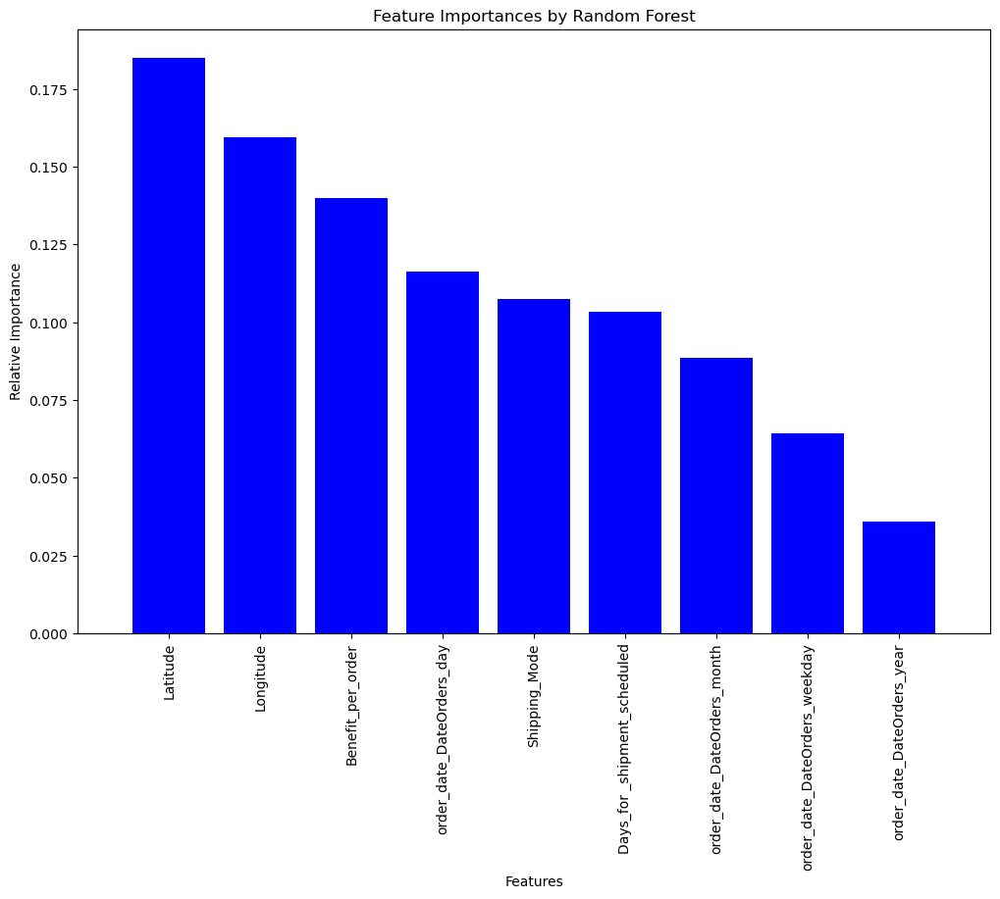

In [82]:
# Assuming 'train_data' is your DataFrame
target = 'Late_delivery_risk'
train_labels = train_data[target]
train_features = train_data.drop(columns=[target])

# Initialize LabelEncoder
le = LabelEncoder()

# Convert all categorical columns to numeric by label encoding
for column in train_features.columns:
    if train_features[column].dtype == 'object' or train_features[column].dtype.name == 'category':
        train_features[column] = le.fit_transform(train_features[column].astype(str))
    elif train_features[column].dtype == 'datetime64[ns]':
        # Extracting date features
        train_features[f'{column}_year'] = train_features[column].dt.year
        train_features[f'{column}_month'] = train_features[column].dt.month
        train_features[f'{column}_day'] = train_features[column].dt.day
        train_features[f'{column}_weekday'] = train_features[column].dt.weekday
        # After extraction, drop the original datetime column
        train_features.drop(columns=[column], inplace=True)

# Fit Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(train_features, train_labels)

# Get feature importances
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Plotting the feature importances
plt.figure(figsize=(12, 8))
plt.title('Feature Importances by Random Forest')
plt.bar(range(train_features.shape[1]), importances[indices], color='b', align='center')
plt.xticks(range(train_features.shape[1]), train_features.columns[indices], rotation=90)
plt.xlim([-1, train_features.shape[1]])
plt.ylabel('Relative Importance')
plt.xlabel('Features')
plt.show()

#### 5. MACHINE LEARNING AND DEEP LEARNING MODELING

In [83]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Separate features and target from train_data
target_column_name = 'Late_delivery_risk'
X = train_data.drop(columns=[target_column_name])
y = train_data[target_column_name]

# Drop datetime columns from X if any
datetime_columns = X.select_dtypes(include=['datetime']).columns
X = X.drop(columns=datetime_columns)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Logistic Regression
logistic_model = LogisticRegression(random_state=42, max_iter=1000)
logistic_model.fit(X_scaled, y)
logistic_preds = logistic_model.predict(X_scaled)
logistic_probs = logistic_model.predict_proba(X_scaled)[:, 1]

logistic_balanced_acc = balanced_accuracy_score(y, logistic_preds)
logistic_auc = roc_auc_score(y, logistic_probs)

print(f"Logistic Regression - Balanced Accuracy: {logistic_balanced_acc:.4f}, AUC: {logistic_auc:.4f}")

Logistic Regression - Balanced Accuracy: 0.7027, AUC: 0.7167


In [84]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import balanced_accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np


# K-Nearest Neighbors
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_scaled, y)
knn_preds = knn_model.predict(X_scaled)
knn_probs = knn_model.predict_proba(X_scaled)[:, 1]

knn_balanced_acc = balanced_accuracy_score(y, knn_preds)
knn_auc = roc_auc_score(y, knn_probs)

print(f"KNN - Balanced Accuracy: {knn_balanced_acc:.4f}, AUC: {knn_auc:.4f}")

KNN - Balanced Accuracy: 0.7628, AUC: 0.8460


In [85]:
from sklearn.tree import DecisionTreeClassifier

# Decision Tree
tree_model = DecisionTreeClassifier(random_state=42, max_depth=10)  # Adjust max_depth as needed
tree_model.fit(X_scaled, y)
tree_preds = tree_model.predict(X_scaled)
tree_probs = tree_model.predict_proba(X_scaled)[:, 1]

tree_balanced_acc = balanced_accuracy_score(y, tree_preds)
tree_auc = roc_auc_score(y, tree_probs)

print(f"Decision Tree - Balanced Accuracy: {tree_balanced_acc:.4f}, AUC: {tree_auc:.4f}")


Decision Tree - Balanced Accuracy: 0.7186, AUC: 0.7539


In [86]:
from sklearn.ensemble import RandomForestClassifier

# Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=10)  # Adjust max_depth and n_estimators if needed
rf_model.fit(X_scaled, y)
rf_preds = rf_model.predict(X_scaled)
rf_probs = rf_model.predict_proba(X_scaled)[:, 1]

rf_balanced_acc = balanced_accuracy_score(y, rf_preds)
rf_auc = roc_auc_score(y, rf_probs)

print(f"Random Forest - Balanced Accuracy: {rf_balanced_acc:.4f}, AUC: {rf_auc:.4f}")


Random Forest - Balanced Accuracy: 0.7195, AUC: 0.8099


In [87]:
from xgboost import XGBClassifier

# XGBoost
xgb_model = XGBClassifier(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'  # Required to suppress warnings
)

xgb_model.fit(X_scaled, y)
xgb_preds = xgb_model.predict(X_scaled)
xgb_probs = xgb_model.predict_proba(X_scaled)[:, 1]

xgb_balanced_acc = balanced_accuracy_score(y, xgb_preds)
xgb_auc = roc_auc_score(y, xgb_probs)

print(f"XGBoost - Balanced Accuracy: {xgb_balanced_acc:.4f}, AUC: {xgb_auc:.4f}")


c:\Users\User\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [14:03:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost - Balanced Accuracy: 0.7175, AUC: 0.7767


In [88]:
from lightgbm import LGBMClassifier

# LightGBM
lgbm_model = LGBMClassifier(
    n_estimators=100,
    max_depth=-1,  # No limit on tree depth by default
    learning_rate=0.1,
    random_state=42
)

lgbm_model.fit(X_scaled, y)
lgbm_preds = lgbm_model.predict(X_scaled)
lgbm_probs = lgbm_model.predict_proba(X_scaled)[:, 1]

lgbm_balanced_acc = balanced_accuracy_score(y, lgbm_preds)
lgbm_auc = roc_auc_score(y, lgbm_probs)

print(f"LightGBM - Balanced Accuracy: {lgbm_balanced_acc:.4f}, AUC: {lgbm_auc:.4f}")


[LightGBM] [Info] Number of positive: 79180, number of negative: 65235
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 774
[LightGBM] [Info] Number of data points in the train set: 144415, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.548281 -> initscore=0.193728
[LightGBM] [Info] Start training from score 0.193728
LightGBM - Balanced Accuracy: 0.7172, AUC: 0.7726


In [89]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

# Define the neural network
model = Sequential([
    Dense(64, activation='relu', input_dim=X_scaled.shape[1]),
    Dropout(0.2),  # Dropout to prevent overfitting
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',  # Loss function for binary classification
    metrics=['accuracy']
)

# Train the neural network
history = model.fit(
    X_scaled, y,
    epochs=10,  # Fewer epochs for lightweight training
    batch_size=32,
    verbose=1,
    validation_split=0.2  # Use 20% of the training data for validation
)

# Predictions
nn_probs = model.predict(X_scaled).flatten()
nn_preds = (nn_probs > 0.5).astype(int)

# Metrics
nn_balanced_acc = balanced_accuracy_score(y, nn_preds)
nn_auc = roc_auc_score(y, nn_probs)

print(f"Neural Network - Balanced Accuracy: {nn_balanced_acc:.4f}, AUC: {nn_auc:.4f}")


Epoch 1/10


c:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3611/3611 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.6812 - loss: 0.6006 - val_accuracy: 0.6942 - val_loss: 0.5710
Epoch 2/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6928 - loss: 0.5750 - val_accuracy: 0.6985 - val_loss: 0.5687
Epoch 3/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6931 - loss: 0.5735 - val_accuracy: 0.6977 - val_loss: 0.5691
Epoch 4/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6928 - loss: 0.5716 - val_accuracy: 0.6990 - val_loss: 0.5679
Epoch 5/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6935 - loss: 0.5716 - val_accuracy: 0.6987 - val_loss: 0.5683
Epoch 6/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6957 - loss: 0.5702 - val_accuracy: 0.6988 - val_loss: 0.5688
Epoch 7/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6948 - loss: 0.5721 - val_accuracy: 0.6990 - val_loss: 0.5688
Epoch 8/10
3611/3611 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.6934 - loss: 0.5713 - val_accurac

In [90]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler

# Separate features and target from val_data
X_val = val_data.drop(columns=[target_column_name])
y_val = val_data[target_column_name]

# Drop datetime columns from X_val if any
datetime_columns_val = X_val.select_dtypes(include=['datetime']).columns
X_val = X_val.drop(columns=datetime_columns_val)

# Ensure all columns are numeric
X_val = X_val.apply(pd.to_numeric, errors='coerce')

# Handle missing values if any
X_val.fillna(X_val.mean(), inplace=True)

# Standardize the features
X_val_scaled = scaler.transform(X_val)  # Use the scaler fitted on train data

# Logistic Regression (using the already trained model)
logistic_preds_val = logistic_model.predict(X_val_scaled)
logistic_probs_val = logistic_model.predict_proba(X_val_scaled)[:, 1]

# Metrics for validation data
logistic_balanced_acc_val = balanced_accuracy_score(y_val, logistic_preds_val)
logistic_auc_val = roc_auc_score(y_val, logistic_probs_val)

print(f"Validation - Logistic Regression - Balanced Accuracy: {logistic_balanced_acc_val:.4f}, AUC: {logistic_auc_val:.4f}")

Validation - Logistic Regression - Balanced Accuracy: 0.6988, AUC: 0.7121


In [91]:
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

# KNN Predictions on Validation Data
knn_preds_val = knn_model.predict(X_val_scaled)
knn_probs_val = knn_model.predict_proba(X_val_scaled)[:, 1]

# Metrics for validation data
knn_balanced_acc_val = balanced_accuracy_score(y_val, knn_preds_val)
knn_auc_val = roc_auc_score(y_val, knn_probs_val)

print(f"Validation - KNN - Balanced Accuracy: {knn_balanced_acc_val:.4f}, AUC: {knn_auc_val:.4f}")


Validation - KNN - Balanced Accuracy: 0.6508, AUC: 0.7055


In [ ]:
# Decision Tree Predictions on Validation Data
tree_preds_val = tree_model.predict(X_val_scaled)
tree_probs_val = tree_model.predict_proba(X_val_scaled)[:, 1]

# Metrics for validation data
tree_balanced_acc_val = balanced_accuracy_score(y_val, tree_preds_val)
tree_auc_val = roc_auc_score(y_val, tree_probs_val)

print(f"Validation - Decision Tree - Balanced Accuracy: {tree_balanced_acc_val:.4f}, AUC: {tree_auc_val:.4f}")


Validation - Decision Tree - Balanced Accuracy: 0.7100, AUC: 0.7377


In [93]:
# Random Forest Predictions on Validation Data
rf_preds_val = rf_model.predict(X_val_scaled)
rf_probs_val = rf_model.predict_proba(X_val_scaled)[:, 1]

# Metrics for validation data
rf_balanced_acc_val = balanced_accuracy_score(y_val, rf_preds_val)
rf_auc_val = roc_auc_score(y_val, rf_probs_val)

print(f"Validation - Random Forest - Balanced Accuracy: {rf_balanced_acc_val:.4f}, AUC: {rf_auc_val:.4f}")

Validation - Random Forest - Balanced Accuracy: 0.7108, AUC: 0.7532


In [94]:
# XGBoost Predictions on Validation Data
xgb_preds_val = xgb_model.predict(X_val_scaled)
xgb_probs_val = xgb_model.predict_proba(X_val_scaled)[:, 1]

# Metrics for validation data
xgb_balanced_acc_val = balanced_accuracy_score(y_val, xgb_preds_val)
xgb_auc_val = roc_auc_score(y_val, xgb_probs_val)

print(f"Validation - XGBoost - Balanced Accuracy: {xgb_balanced_acc_val:.4f}, AUC: {xgb_auc_val:.4f}")


Validation - XGBoost - Balanced Accuracy: 0.7106, AUC: 0.7474


In [95]:
# LightGBM Predictions on Validation Data
lgbm_preds_val = lgbm_model.predict(X_val_scaled)
lgbm_probs_val = lgbm_model.predict_proba(X_val_scaled)[:, 1]

# Metrics for validation data
lgbm_balanced_acc_val = balanced_accuracy_score(y_val, lgbm_preds_val)
lgbm_auc_val = roc_auc_score(y_val, lgbm_probs_val)

print(f"Validation - LightGBM - Balanced Accuracy: {lgbm_balanced_acc_val:.4f}, AUC: {lgbm_auc_val:.4f}")


Validation - LightGBM - Balanced Accuracy: 0.7114, AUC: 0.7459


In [96]:
# Neural Network Predictions on Validation Data
nn_probs_val = model.predict(X_val_scaled).flatten()  # Predict probabilities
nn_preds_val = (nn_probs_val > 0.5).astype(int)       # Convert probabilities to binary predictions

# Metrics for validation data
nn_balanced_acc_val = balanced_accuracy_score(y_val, nn_preds_val)
nn_auc_val = roc_auc_score(y_val, nn_probs_val)

print(f"Validation - Neural Network - Balanced Accuracy: {nn_balanced_acc_val:.4f}, AUC: {nn_auc_val:.4f}")


1129/1129 ━━━━━━━━━━━━━━━━━━━━ 1s 689us/step
Validation - Neural Network - Balanced Accuracy: 0.7083, AUC: 0.7182


In [97]:
# Prepare a results table
results = {
    'Model': [],
    'Dataset': [],
    'Balanced Accuracy': [],
    'AUC': []
}

# Logistic Regression
results['Model'].extend(['Logistic Regression', 'Logistic Regression'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([logistic_balanced_acc, logistic_balanced_acc_val])
results['AUC'].extend([logistic_auc, logistic_auc_val])

# K-Nearest Neighbors
results['Model'].extend(['KNN', 'KNN'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([knn_balanced_acc, knn_balanced_acc_val])
results['AUC'].extend([knn_auc, knn_auc_val])

# Decision Tree
results['Model'].extend(['Decision Tree', 'Decision Tree'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([tree_balanced_acc, tree_balanced_acc_val])
results['AUC'].extend([tree_auc, tree_auc_val])

# Random Forest
results['Model'].extend(['Random Forest', 'Random Forest'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([rf_balanced_acc, rf_balanced_acc_val])
results['AUC'].extend([rf_auc, rf_auc_val])

# XGBoost
results['Model'].extend(['XGBoost', 'XGBoost'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([xgb_balanced_acc, xgb_balanced_acc_val])
results['AUC'].extend([xgb_auc, xgb_auc_val])

# LightGBM
results['Model'].extend(['LightGBM', 'LightGBM'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([lgbm_balanced_acc, lgbm_balanced_acc_val])
results['AUC'].extend([lgbm_auc, lgbm_auc_val])

# Neural Network
results['Model'].extend(['Neural Network', 'Neural Network'])
results['Dataset'].extend(['Train', 'Validation'])
results['Balanced Accuracy'].extend([nn_balanced_acc, nn_balanced_acc_val])
results['AUC'].extend([nn_auc, nn_auc_val])

# Create a DataFrame
results_df = pd.DataFrame(results)

# Display the results table
print(results_df)

                  Model     Dataset  Balanced Accuracy       AUC
0   Logistic Regression       Train           0.702717  0.716672
1   Logistic Regression  Validation           0.698806  0.712112
2                   KNN       Train           0.762840  0.845957
3                   KNN  Validation           0.650842  0.705528
4         Decision Tree       Train           0.718618  0.753900
5         Decision Tree  Validation           0.710022  0.737691
6         Random Forest       Train           0.719483  0.809942
7         Random Forest  Validation           0.710849  0.753204
8               XGBoost       Train           0.717485  0.776657
9               XGBoost  Validation           0.710618  0.747388
10             LightGBM       Train           0.717160  0.772627
11             LightGBM  Validation           0.711401  0.745916
12       Neural Network       Train           0.705962  0.729797
13       Neural Network  Validation           0.708297  0.718194


##### Model Ranking:
1. Random Forest
2. LightGBM
3. XGBoost
4. Decision Tree
5. Neural Network
6. Logistic Regression
7. KNN

#####  6. CONVERTING MODEL TO EDGE COMPUTING STYLE

In [98]:
pip install skl2onnx --extra-index-url https://pypi.org/simple


Looking in indexes: https://pypi.org/simple, https://pypi.org/simple
  Using cached protobuf-3.20.2-py2.py3-none-any.whl.metadata (720 bytes)
Using cached protobuf-3.20.2-py2.py3-none-any.whl (162 kB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.2
    Uninstalling protobuf-5.29.2:
      Successfully uninstalled protobuf-5.29.2
Note: you may need to restart the kernel to use updated packages.


  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-intel 2.18.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.3, but you have protobuf 3.20.2 which is incompatible.


In [99]:
"""
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType
import onnx
import onnxruntime as rt
import numpy as np

# Assuming `train_features` and `train_labels` are your training data
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(train_features, train_labels)

# Define the input shape for ONNX conversion
initial_type = [('float_input', FloatTensorType([None, train_features.shape[1]]))]

# Convert the Random Forest model to ONNX
onnx_rf = convert_sklearn(rf_model, initial_types=initial_type)

# Save the ONNX model to a file
onnx_model_path = "random_forest_model.onnx"
with open(onnx_model_path, "wb") as f:
    f.write(onnx_rf.SerializeToString())

print("Random Forest model has been converted to ONNX format.")
"""

'\nfrom skl2onnx import convert_sklearn\nfrom skl2onnx.common.data_types import FloatTensorType\nimport onnx\nimport onnxruntime as rt\nimport numpy as np\n\n# Assuming `train_features` and `train_labels` are your training data\nrf_model = RandomForestClassifier(n_estimators=100, random_state=42)\nrf_model.fit(train_features, train_labels)\n\n# Define the input shape for ONNX conversion\ninitial_type = [(\'float_input\', FloatTensorType([None, train_features.shape[1]]))]\n\n# Convert the Random Forest model to ONNX\nonnx_rf = convert_sklearn(rf_model, initial_types=initial_type)\n\n# Save the ONNX model to a file\nonnx_model_path = "random_forest_model.onnx"\nwith open(onnx_model_path, "wb") as f:\n    f.write(onnx_rf.SerializeToString())\n\nprint("Random Forest model has been converted to ONNX format.")\n'

In [100]:
""" 
# Load the ONNX model for inference
onnx_session = rt.InferenceSession(onnx_model_path, providers=["CPUExecutionProvider"])

# Prepare sample input for testing
sample_input = train_features.iloc[0:1].to_numpy().astype(np.float32)

# Run inference
input_name = onnx_session.get_inputs()[0].name
output_name = onnx_session.get_outputs()[0].name
predicted = onnx_session.run([output_name], {input_name: sample_input})
print("ONNX Prediction:", predicted)
"""


' \n# Load the ONNX model for inference\nonnx_session = rt.InferenceSession(onnx_model_path, providers=["CPUExecutionProvider"])\n\n# Prepare sample input for testing\nsample_input = train_features.iloc[0:1].to_numpy().astype(np.float32)\n\n# Run inference\ninput_name = onnx_session.get_inputs()[0].name\noutput_name = onnx_session.get_outputs()[0].name\npredicted = onnx_session.run([output_name], {input_name: sample_input})\nprint("ONNX Prediction:", predicted)\n'

In [101]:
import tensorflow as tf

# Save the Keras model
model.save("neural_network_model.h5")
print("Neural Network model saved!")

# Convert the Neural Network model to TensorFlow Lite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TFLite model
with open("neural_network_model.tflite", "wb") as f:
    f.write(tflite_model)

print("Neural Network model has been converted to TensorFlow Lite format!")

# Test the TensorFlow Lite model
interpreter = tf.lite.Interpreter(model_path="neural_network_model.tflite")
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Prepare a test input (ensure dtype matches TensorFlow Lite model requirements)
test_input = np.array(X_val[:1], dtype=np.float32)

# Set the input tensor
interpreter.set_tensor(input_details[0]['index'], test_input)

# Run inference
interpreter.invoke()

# Get the output tensor
predictions = interpreter.get_tensor(output_details[0]['index'])
print("TFLite Model Predictions:", predictions)


Neural Network model saved!
INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmph0s1nifj\assets


INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmph0s1nifj\assets


Saved artifact at 'C:\Users\User\AppData\Local\Temp\tmph0s1nifj'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 5), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  2458126260880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126262224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126262032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126261456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126261072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126263184: TensorSpec(shape=(), dtype=tf.resource, name=None)
Neural Network model has been converted to TensorFlow Lite format!
TFLite Model Predictions: [[0.20524736]]


In [102]:
# Quantization example
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_quantized_model = converter.convert()

# Save the quantized model
with open("neural_network_model_quantized.tflite", "wb") as f:
    f.write(tflite_quantized_model)

print("Quantized TFLite model saved!")


INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmp9531eqrd\assets


INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmp9531eqrd\assets


Saved artifact at 'C:\Users\User\AppData\Local\Temp\tmp9531eqrd'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 5), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  2458126260880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126262224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126262032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126261456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126261072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2458126263184: TensorSpec(shape=(), dtype=tf.resource, name=None)
Quantized TFLite model saved!


#### 7. CONCLUSION

##### In summary, we applied several models to find the best model to predict the late delivery risk and we may observe that we do not have any overfitting problem because , the models works well in both train and validation sets. We revealed that the best model is Random Forest which predicts 75% correctly in unseen data. As a next step, I converted Random Forest model to Edge Computing style via assist of ONNX package. Additionally, I converted the Neural Network model (70% predictive power) to the Edge Computing style via assist of the Tenserflow Lite package.  
Futrue Recommendations:
 1. Using Hyperparameter Tuning to optimize the models
 2. Usinng different models than provided to also check their performance
 3. Prepare Model for final usage for comapnies.

## ---------------------------------------------------------------------------------------
